## Ucitavanje biblioteka.📚


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sb
import plotly.express as px 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import scipy
from scipy import stats
import sklearn
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix,f1_score,classification_report,accuracy_score, precision_score, recall_score
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier

## Ucitavanje baze ⏳

In [ ]:
pd.options.display.float_format = '{:.2f}'.format
df= pd.read_csv('Hotel Reservations.csv')
df.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0.00,0.00,65.00,0.00,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0.00,0.00,106.68,1.00,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0.00,0.00,60.00,0.00,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0.00,0.00,100.00,0.00,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0.00,0.00,94.50,0.00,Canceled


In [ ]:
vrsta=df.shape[0] # uzorci
kolona=df.shape[1] # obelezja
print("Broj vrsta:",vrsta)
print("Broj kolona:",kolona)

Broj vrsta: 36275
Broj kolona: 19


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31338 entries, 0 to 36274
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          31338 non-null  int64  
 1   no_of_children                        31338 non-null  int64  
 2   no_of_weekend_nights                  31338 non-null  int64  
 3   no_of_week_nights                     31338 non-null  int64  
 4   type_of_meal_plan                     31338 non-null  int64  
 5   required_car_parking_space            31338 non-null  int64  
 6   room_type_reserved                    31338 non-null  int64  
 7   lead_time                             31338 non-null  int64  
 8   arrival_year                          31338 non-null  int64  
 9   arrival_month                         31338 non-null  int64  
 10  arrival_date                          31338 non-null  int64  
 11  market_segment_

In [ ]:
df.describe()   

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00
mean,1.89,0.10,0.85,2.32,0.50,0.03,0.72,94.43,2017.83,7.49,15.53,3.60,0.01,0.01,0.07,105.23,0.62
std,0.49,0.37,0.88,1.41,1.03,0.16,1.40,81.53,0.37,3.01,8.78,0.59,0.11,0.26,1.16,32.17,0.79
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2017.00,1.00,1.00,0.00,0.00,0.00,0.00,20.00,0.00
25%,2.00,0.00,0.00,1.00,0.00,0.00,0.00,30.00,2018.00,5.00,8.00,3.00,0.00,0.00,0.00,81.50,0.00
50%,2.00,0.00,1.00,2.00,0.00,0.00,0.00,70.00,2018.00,8.00,16.00,4.00,0.00,0.00,0.00,100.00,0.00
75%,2.00,0.00,2.00,3.00,0.00,0.00,0.00,139.00,2018.00,10.00,23.00,4.00,0.00,0.00,0.00,120.70,1.00
max,4.00,3.00,7.00,17.00,3.00,1.00,6.00,361.00,2018.00,12.00,31.00,4.00,1.00,13.00,58.00,540.00,5.00


In [ ]:
nan_count = df.isnull().sum()
print(nan_count)
total_nan = nan_count.sum()
print('Ukupan broj nedostajucih vrednosti:',total_nan)

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64
Ukupan broj nedostajucih vrednosti: 0


In [ ]:
print('Type of meal plan:',df['type_of_meal_plan'].unique())
print('Room type reserved:',df['room_type_reserved'].unique())
print('Market segment type:',df['market_segment_type'].unique())
print('Booking status:',df['booking_status'].unique())

Type of meal plan: ['Meal Plan 1' 'Not Selected' 'Meal Plan 2' 'Meal Plan 3']
Room type reserved: ['Room_Type 1' 'Room_Type 4' 'Room_Type 2' 'Room_Type 6' 'Room_Type 5'
 'Room_Type 7' 'Room_Type 3']
Market segment type: ['Offline' 'Online' 'Corporate' 'Aviation' 'Complementary']
Booking status: ['Not_Canceled' 'Canceled' nan]


In [ ]:
#df.dropna(axis=0,inplace=True)
#df.shape[0], df.shape[1]

## Provera da li postoje nelogicne vrednosti 🧐 


In [ ]:
df['no_of_adults'].unique()

array([2, 3, 1, 4])

In [ ]:
count = len(df[(df['no_of_adults'] == 0)])
print(count)


0


In [ ]:
df_filtered = df[(df['no_of_adults'] == 0) & (df['no_of_children'] != 0)]
df_filtered.head()


,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
32,INN00033,0,2,0,3,Meal Plan 1,0,Room_Type 2,56,2018,12,7,Online,0,0,0,82.44,1,Not_Canceled
287,INN00288,0,2,2,2,Meal Plan 1,0,Room_Type 1,68,2018,4,24,Online,0,0,0,108.38,1,Canceled
653,INN00654,0,2,1,2,Meal Plan 1,0,Room_Type 2,78,2018,8,19,Online,0,0,0,115.68,1,Not_Canceled
937,INN00938,0,2,0,3,Meal Plan 1,0,Room_Type 2,40,2018,1,14,Online,0,0,0,6.67,1,Not_Canceled
954,INN00955,0,2,1,1,Meal Plan 1,0,Room_Type 2,92,2018,10,29,Online,0,0,0,81.50,2,Not_Canceled


In [ ]:
count = len(df[(df['no_of_adults'] == 0) & (df['no_of_children'] != 0)])
print('Na koliko mesta je broj odraslih nula i broj dece razlicit od nula:',count)

Na koliko mesta je broj odraslih nula i broj dece razlicit od nula: 139


In [ ]:
df['no_of_children'].unique()

array([ 0,  2,  1,  3, 10,  9])

In [ ]:
count = len(df[(df['no_of_children'] == 9)])
print('Koliko puta se pojavljuje daje broj dece 9:',count)


2
Koliko puta se pojavljuje daje broj dece 9: 2


In [ ]:
count = len(df[(df['no_of_children'] == 10)])
print('Koliko puta se pojavljuje da je broj dece 10:',count)


Koliko puta se pojavljuje da je broj dece 10: 1


In [ ]:
sorted(df['arrival_month'].unique())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [ ]:
sorted(df['arrival_date'].unique())

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31]

In [ ]:
sorted(df['no_of_weekend_nights'].unique())

[0, 1, 2, 3, 4, 5, 6, 7]

In [ ]:
sorted(df['no_of_week_nights'].unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

In [ ]:
print(len(df[(df['no_of_weekend_nights']==0) & (df['no_of_week_nights']==0)])) 

0


In [ ]:
sorted(df['required_car_parking_space'].unique())

[0, 1]

In [ ]:
sorted(df['lead_time'].unique())

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [ ]:
sorted(df['arrival_year'].unique())

[2017, 2018]

In [ ]:
sorted(df['arrival_month'].unique())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [ ]:
sorted(df['arrival_month'].unique())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [ ]:
sorted(df['arrival_date'].unique())

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31]

In [ ]:
sorted(df['no_of_previous_cancellations'].unique())

[0, 1, 2, 3, 4, 5, 6, 11, 13]

In [ ]:
sorted(df['no_of_previous_bookings_not_canceled'].unique())

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58]

In [ ]:
sorted(df['avg_price_per_room'].unique())

[0.0,
 0.5,
 1.0,
 1.48,
 1.6,
 2.0,
 3.0,
 4.5,
 6.0,
 6.5,
 6.67,
 9.0,
 12.0,
 14.0,
 15.0,
 18.0,
 18.6,
 19.15,
 20.0,
 23.0,
 26.35,
 29.0,
 31.0,
 32.5,
 32.71,
 35.0,
 35.2,
 36.25,
 36.38,
 37.07,
 37.33,
 37.5,
 38.0,
 38.33,
 38.67,
 39.0,
 40.0,
 40.5,
 40.67,
 41.0,
 41.43,
 41.76,
 41.84,
 42.0,
 42.17,
 42.28,
 42.5,
 43.0,
 43.33,
 43.43,
 43.5,
 43.8,
 44.0,
 44.6,
 44.67,
 44.8,
 45.0,
 45.33,
 45.5,
 45.87,
 45.9,
 46.0,
 46.33,
 46.4,
 46.51,
 46.54,
 46.63,
 46.66,
 46.67,
 46.9,
 47.0,
 47.2,
 47.25,
 47.33,
 47.43,
 47.5,
 47.67,
 47.78,
 47.92,
 48.0,
 48.33,
 48.4,
 48.5,
 48.51,
 48.6,
 48.67,
 49.07,
 49.09,
 49.43,
 49.5,
 49.58,
 49.59,
 49.67,
 49.68,
 49.74,
 50.0,
 50.3,
 50.33,
 50.4,
 50.6,
 51.0,
 51.05,
 51.09,
 51.19,
 51.28,
 51.3,
 51.5,
 51.6,
 51.69,
 51.71,
 51.96,
 51.97,
 52.0,
 52.02,
 52.36,
 52.39,
 52.5,
 52.7,
 52.85,
 53.19,
 53.24,
 53.25,
 53.3,
 53.38,
 53.45,
 53.47,
 53.5,
 53.58,
 53.67,
 53.72,
 53.85,
 53.95,
 53.97,
 54.0,
 54.

## Odbacivanje nelogicnih vrednosti 🔪

In [ ]:
indexes_to_drop = df.loc[df['no_of_adults']==0].index
df.drop(indexes_to_drop,axis=0,inplace=True )
print(df.shape )
print(pd.unique(df['no_of_adults']))

(36136, 19)
[2 1 3 4]


In [ ]:
indexes_to_drop = df.loc[df['no_of_children']==9].index
df.drop(indexes_to_drop,axis=0,inplace=True )
print(df.shape )
print(pd.unique(df['no_of_children']))

(36134, 19)
[ 0  2  1  3 10]


In [ ]:
indexes_to_drop = df.loc[df['no_of_children']==10].index
df.drop(indexes_to_drop,axis=0,inplace=True )
print(df.shape )
print(pd.unique(df['no_of_children']))

(36133, 19)
[0 2 1 3]


In [ ]:
indexes_to_drop = df.loc[df['avg_price_per_room']<20].index
df.drop(indexes_to_drop,axis=0,inplace=True )
print(df.shape )



(35527, 19)


In [ ]:
indexes_to_drop = df.loc[df['lead_time']>365].index
df.drop(indexes_to_drop,axis=0,inplace=True )

print(sorted(pd.unique(df['lead_time'])))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [ ]:
indexes_to_drop = df.loc[df['lead_time']<5].index
df.drop(indexes_to_drop,axis=0,inplace=True )

print(sorted(pd.unique(df['lead_time'])))

[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224,

## Analiza 💾 
ne mora da se pokrece svaki put

In [ ]:
sb.set_style("darkgrid")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31338 entries, 0 to 36274
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          31338 non-null  int64  
 1   no_of_children                        31338 non-null  int64  
 2   no_of_weekend_nights                  31338 non-null  int64  
 3   no_of_week_nights                     31338 non-null  int64  
 4   type_of_meal_plan                     31338 non-null  int64  
 5   required_car_parking_space            31338 non-null  int64  
 6   room_type_reserved                    31338 non-null  int64  
 7   lead_time                             31338 non-null  int64  
 8   arrival_year                          31338 non-null  int64  
 9   arrival_month                         31338 non-null  int64  
 10  arrival_date                          31338 non-null  int64  
 11  market_segment_

(0.0, 500.0)

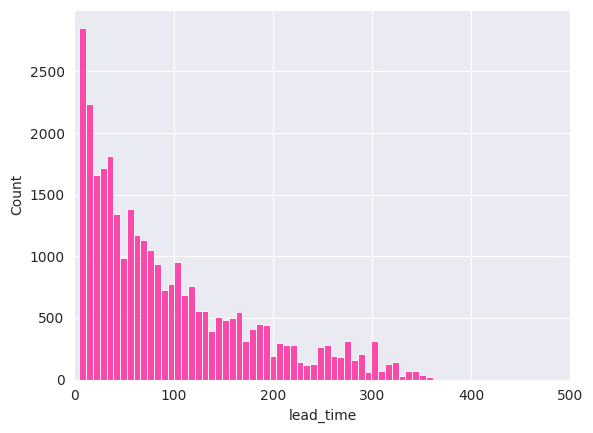

In [ ]:
sb.histplot(df["lead_time"],color='deeppink')
plt.xlim(0,500)


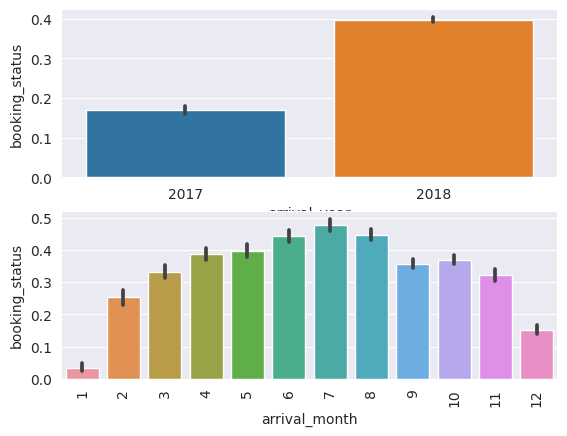

In [ ]:
fig, ax =plt.subplots(2,1)
sns.barplot(x = df["arrival_year"], y = df["booking_status"]=='Canceled', ax = ax[0])
sns.barplot(x = df["arrival_month"], y = df["booking_status"]=='Canceled', ax = ax[1])
plt.xticks(rotation=90)
plt.show()

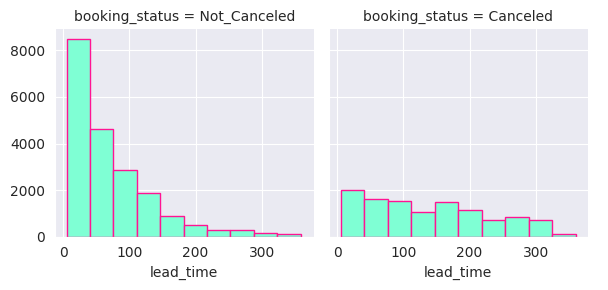

In [ ]:

grid = sb.FacetGrid(df, col='booking_status')
grid.map(plt.hist, 'lead_time',color='aquamarine',edgecolor = 'deeppink')
grid.add_legend()

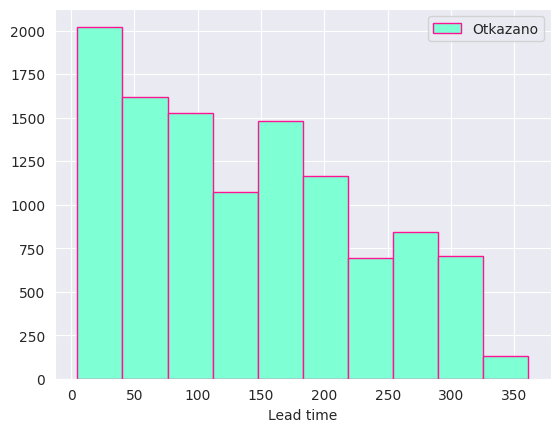

In [ ]:
df_otkazano = df.loc[df['booking_status'] == 'Canceled']

plt.figure()
plt.hist(df_otkazano["lead_time"], color='aquamarine',edgecolor = 'deeppink', alpha=1, label="Otkazano",)

plt.xlabel("Lead time")

plt.legend()
plt.show()



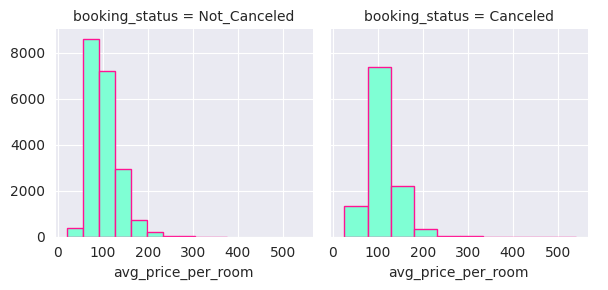

In [ ]:

grid = sb.FacetGrid(df, col='booking_status')
grid.map(plt.hist, 'avg_price_per_room',color='aquamarine',edgecolor = 'deeppink',)
grid.add_legend()

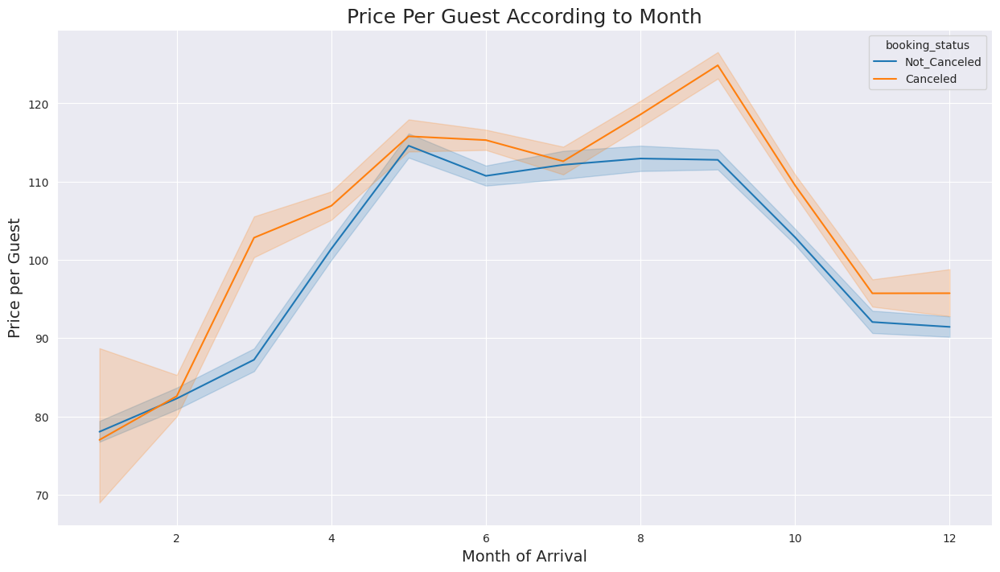

In [ ]:
plt.figure(figsize = (15,8))
fig = sns.lineplot(x = 'arrival_month', 
             y = 'avg_price_per_room', 
             hue='booking_status',
             data =df
            )
plt.xlabel('Month of Arrival', fontsize = 14)
plt.ylabel('Price per Guest', fontsize = 14)
plt.title('Price Per Guest According to Month', fontsize = 18);

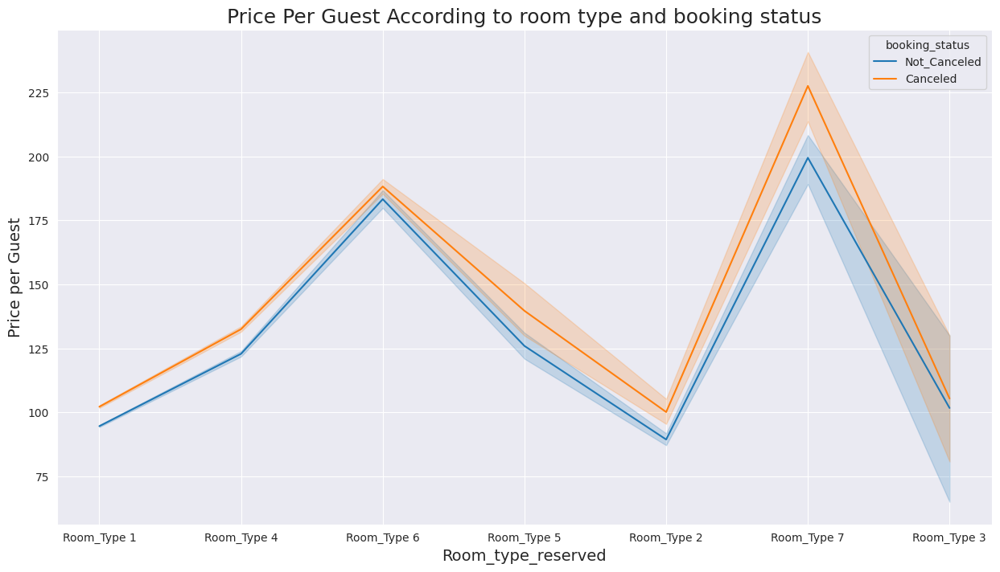

In [ ]:
plt.figure(figsize = (15,8))
fig = sns.lineplot(x = 'room_type_reserved', 
             y = 'avg_price_per_room', 
             hue='booking_status',
             data =df
            )
plt.xlabel('Room_type_reserved', fontsize = 14)
plt.ylabel('Price per Guest', fontsize = 14)
plt.title('Price Per Guest According to room type and booking status', fontsize = 18);

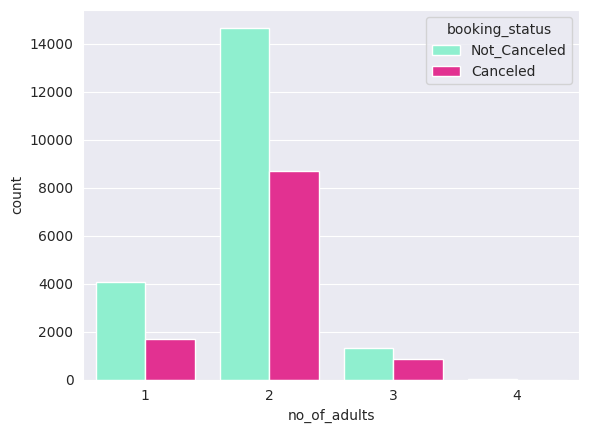

In [ ]:
sb.countplot(data=df, x='no_of_adults', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")




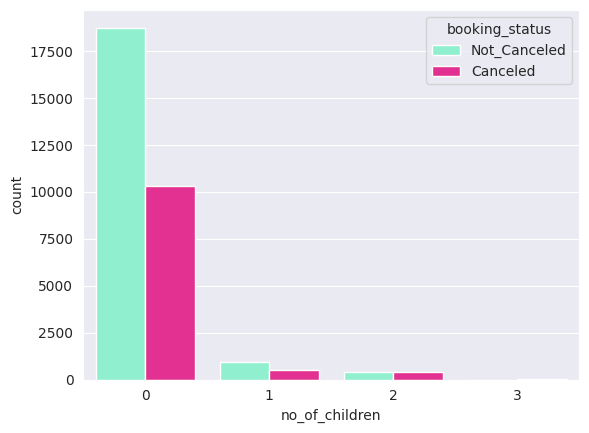

In [ ]:
#Gledamo - kolika je sansa da ce otkazati ljudi sa decom

sb.countplot(data=df, x='no_of_children', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

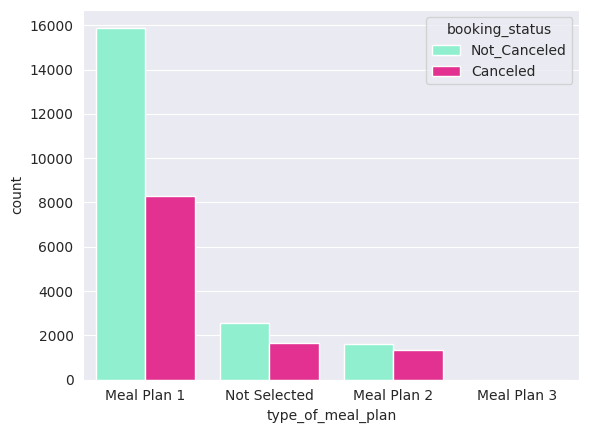

In [ ]:
sb.countplot(data=df, x='type_of_meal_plan', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

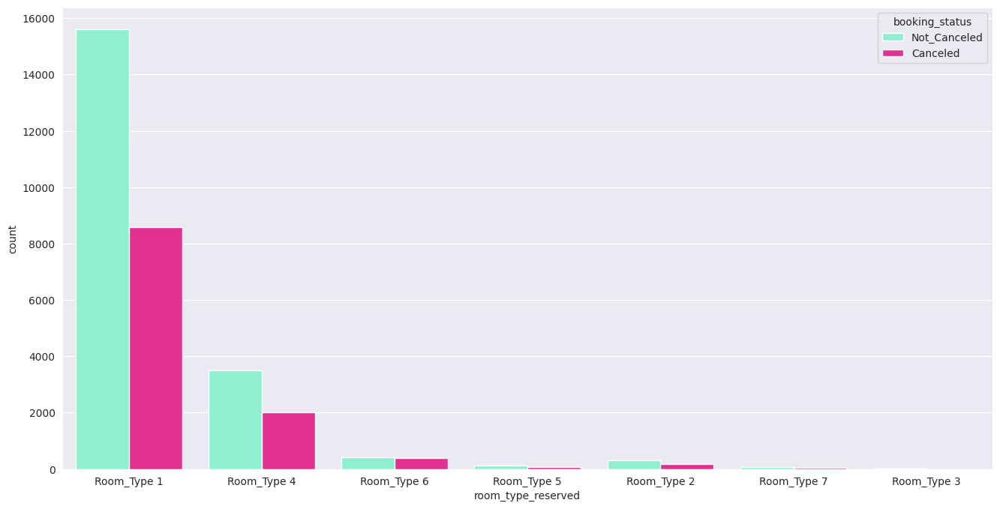

In [ ]:
plt.figure(figsize = (16,8))
sb.countplot(data=df, x='room_type_reserved', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

Procenat neotkazivanja kod novih gostiju =  63.653995345228864
Procenat neotkazivanja kod starih gostiju=  96.01990049751244
Otkazivanje od strane novih gostiju =  36.34600465477114
Otkazivanje od strane starih gostiju =  3.9800995024875623


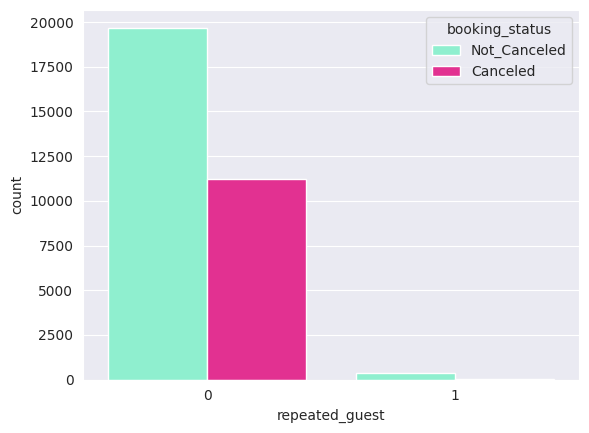

In [ ]:
sb.countplot(data=df, x='repeated_guest', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
novi_gost_otkazali = df[(df['repeated_guest']==0) & (df['booking_status']=='Canceled')] #novi gost znaci - repeated guest 0 jer nije pre bio, i gledamo da je otkazao, pa posto je cancelled - 0 zato je booking status 0
stari_gost_otkazali= df[(df['repeated_guest']==1) & (df['booking_status']=='Canceled')] #stari gost koji je bio - znaci repeated guest 1, a da je otkazao - booking status  0 

novi_gost_neotkazano = df[(df['repeated_guest']==0) & (df['booking_status']=='Not_Canceled')] 
stari_gost_neotkazano= df[(df['repeated_guest']==1) & (df['booking_status']=='Not_Canceled')] 

print('Procenat neotkazivanja kod novih gostiju = ', ((len(novi_gost_neotkazano))/(len(df[df['repeated_guest']==0])))*100) # 
print('Procenat neotkazivanja kod starih gostiju= ', ((len(stari_gost_neotkazano))/(len(df[df['repeated_guest']==1])))*100) # 

print('Otkazivanje od strane novih gostiju = ', ((len(novi_gost_otkazali))/(len(df[df['repeated_guest']==0])))*100) # 
print('Otkazivanje od strane starih gostiju = ', ((len(stari_gost_otkazali))/(len(df[df['repeated_guest']==1])))*100) # 
sb.set_style("darkgrid")

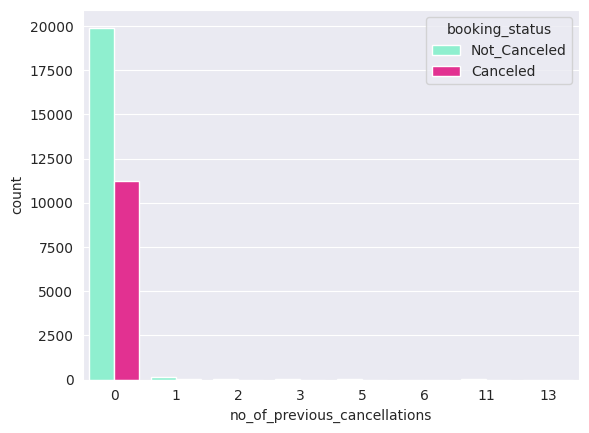

In [ ]:
sb.countplot(data=df, x='no_of_previous_cancellations', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

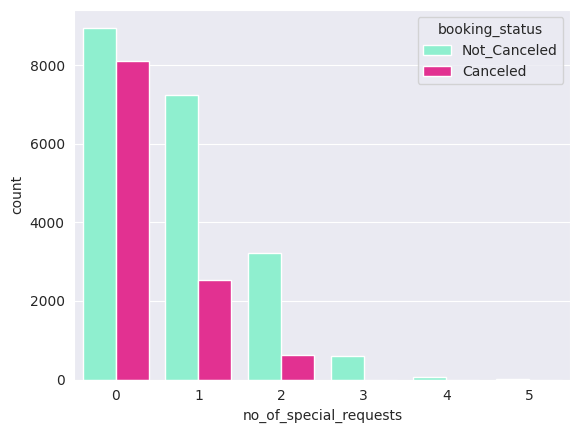

In [ ]:
sb.countplot(data=df, x='no_of_special_requests', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

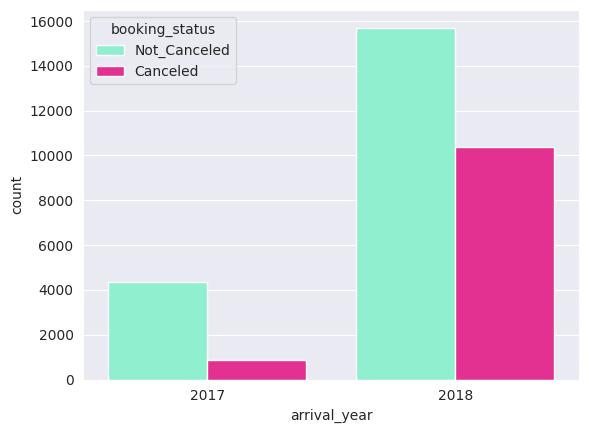

In [ ]:
sb.countplot(data=df, x='arrival_year', hue='booking_status',palette=sns.color_palette(['aquamarine', 'deeppink']))
sb.set_style("darkgrid")

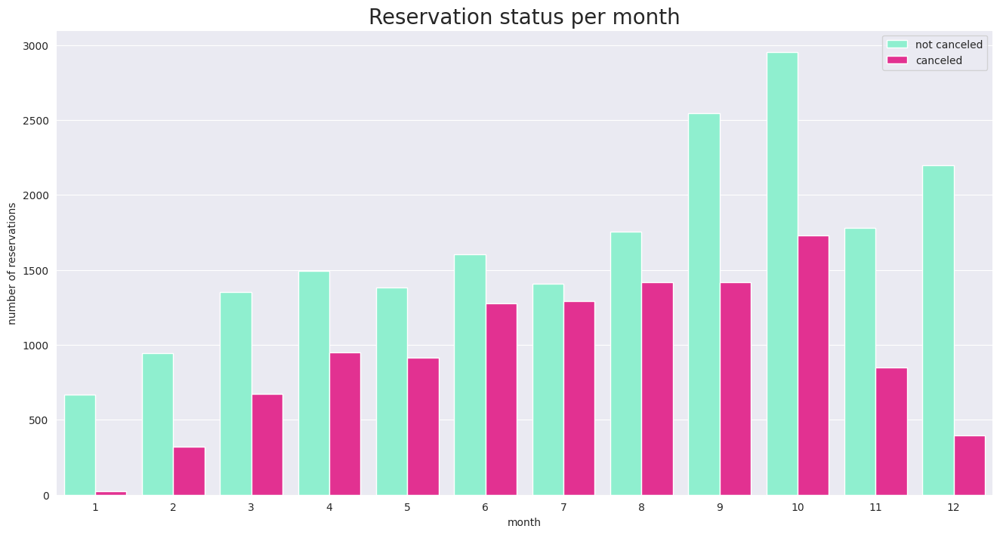

In [ ]:

plt.figure(figsize = (16,8))
ax1 = sns.countplot(x = 'arrival_month',hue = 'booking_status',data = df,palette=sns.color_palette(['aquamarine', 'deeppink']))
legend_labels,_ = ax1. get_legend_handles_labels()
plt.title('Reservation status per month',size = 20)
plt.xlabel('month')
plt.ylabel('number of reservations')
plt.legend(['not canceled','canceled'])
plt.show()
sb.set_style("darkgrid")

In [ ]:
month_count = df.groupby(['arrival_month', 'booking_status']).size().to_frame(name='count')
month_perct = month_count.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
print(month_perct)

                              count
arrival_month booking_status       
1             Canceled         3.47
              Not_Canceled    96.53
2             Canceled        25.34
              Not_Canceled    74.66
3             Canceled        33.19
              Not_Canceled    66.81
4             Canceled        38.84
              Not_Canceled    61.16
5             Canceled        39.83
              Not_Canceled    60.17
6             Canceled        44.38
              Not_Canceled    55.62
7             Canceled        47.78
              Not_Canceled    52.22
8             Canceled        44.71
              Not_Canceled    55.29
9             Canceled        35.80
              Not_Canceled    64.20
10            Canceled        36.98
              Not_Canceled    63.02
11            Canceled        32.26
              Not_Canceled    67.74
12            Canceled        15.28
              Not_Canceled    84.72


<ipython-input-52-eb69425464d5>:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  month_perct = month_count.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))


In [ ]:
year_count = df.groupby(['arrival_year', 'booking_status']).size().to_frame(name='count')
year_perct = year_count.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
print(year_perct)



                             count
arrival_year booking_status       
2017         Canceled        16.93
             Not_Canceled    83.07
2018         Canceled        39.77
             Not_Canceled    60.23


<ipython-input-53-25d86ba09c5a>:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  year_perct = year_count.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))


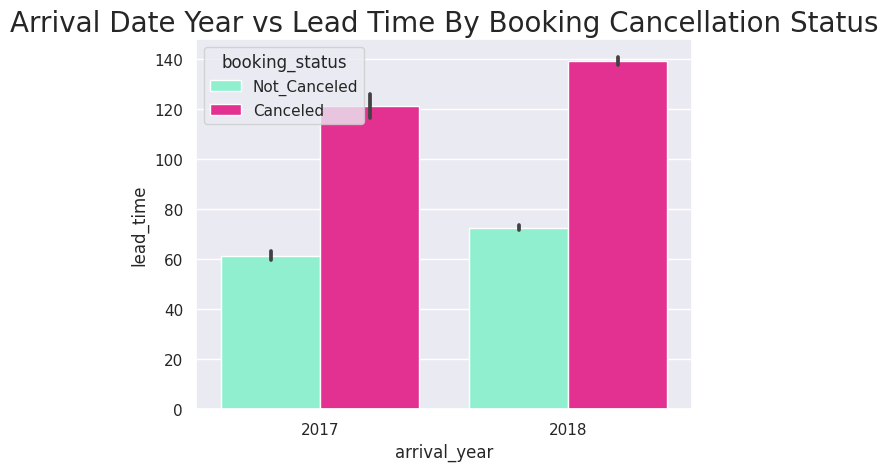

In [ ]:
sns.set(style = "darkgrid")
plt.title("Arrival Date Year vs Lead Time By Booking Cancellation Status", fontdict = {'fontsize': 20})
ax = sns.barplot(x = "arrival_year", y = "lead_time" ,hue = 'booking_status', data = df,palette=sns.color_palette(['aquamarine', 'deeppink']))

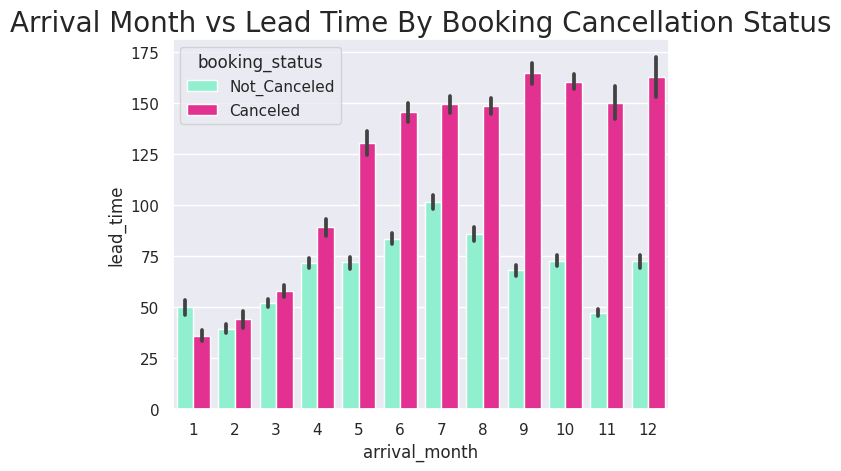

In [ ]:
sns.set(style = "darkgrid")
plt.title("Arrival Month vs Lead Time By Booking Cancellation Status", fontdict = {'fontsize': 20})
ax = sns.barplot(x = "arrival_month", y = "lead_time" ,hue = 'booking_status', data = df,palette=sns.color_palette(['aquamarine', 'deeppink']))

In [ ]:
non_cancelled_reservations_df = df[df['booking_status'] == 'Not_Canceled']
cancelled_reservations_df=df[df['booking_status']=='Canceled']

In [ ]:

fig=px.pie(non_cancelled_reservations_df, 
       values = non_cancelled_reservations_df['market_segment_type'].value_counts(), 
       names = non_cancelled_reservations_df['market_segment_type'].unique(),
       color_discrete_sequence=px.colors.sequential.Redor,
       title='Market segment type not cancelled reservations'
       )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [ ]:
fig=px.pie(cancelled_reservations_df, 
       values = cancelled_reservations_df['market_segment_type'].value_counts(), 
       names = cancelled_reservations_df['market_segment_type'].unique(),
       color_discrete_sequence=px.colors.sequential.Burg,
       title='Market segment type cancelled reservations'
       )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

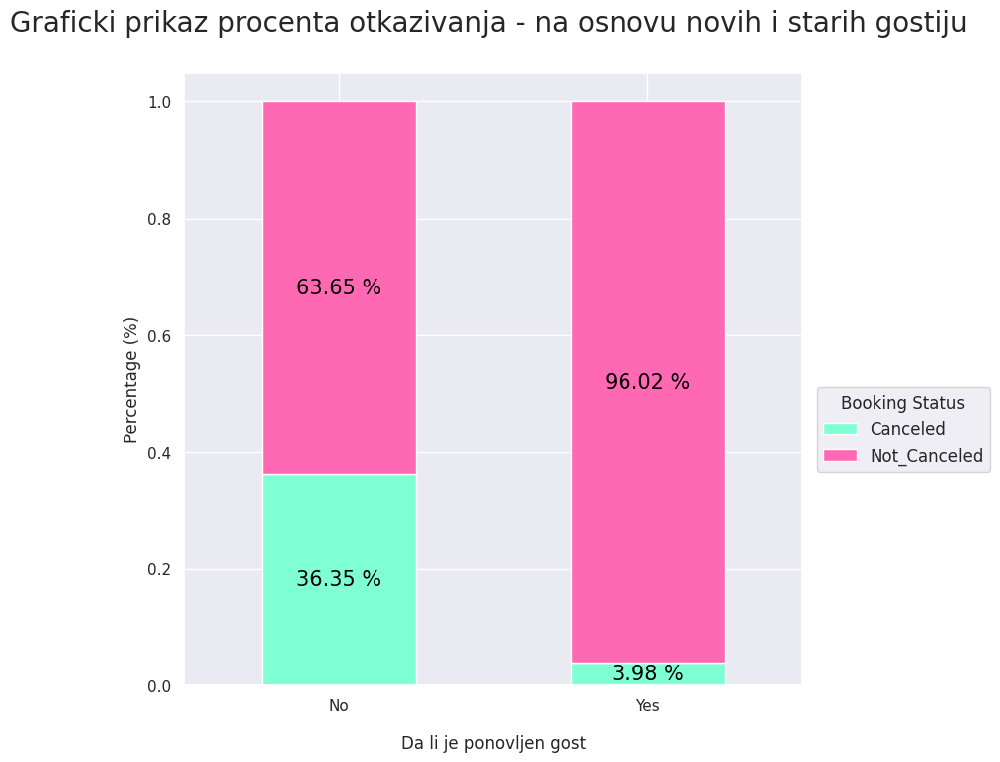

In [ ]:
c = ['aquamarine', 'hotpink']

repeat_ax = pd.crosstab(df['repeated_guest'], df['booking_status'], normalize = 'index').plot.bar(stacked=True, figsize=(8,8), color=c)
plt.legend(bbox_to_anchor=(1.01, 0.5), title='Booking Status', fontsize=12, title_fontsize=12)
    
for p in repeat_ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    repeat_ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center',
            color='black', fontsize=15)
    
plt.title('Graficki prikaz procenta otkazivanja - na osnovu novih i starih gostiju ', fontsize=20, pad=30)    
repeat_ax.set_xticklabels(['No', 'Yes'], rotation=360)
plt.xlabel('Da li je ponovljen gost', fontsize=12, labelpad=15)
plt.ylabel('Percentage (%)', fontsize=12)
plt.show()
sb.set_style("darkgrid")

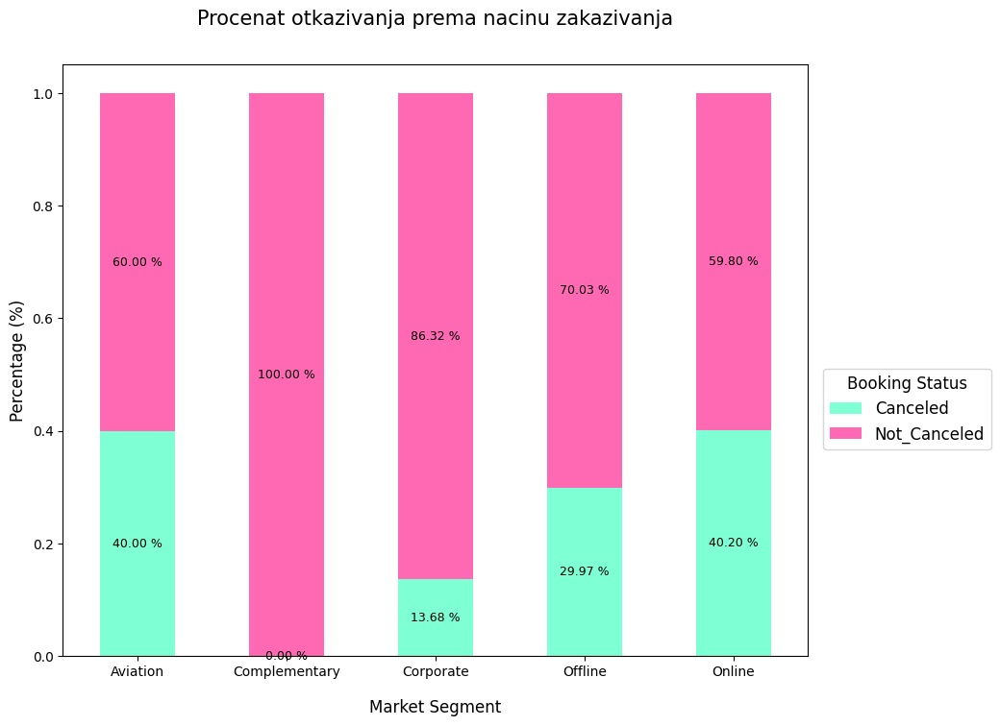

In [ ]:
c = ['aquamarine', 'hotpink']
market_ax = pd.crosstab(df['market_segment_type'], df['booking_status'], normalize = 'index').plot.bar(stacked=True, figsize=(10,8),color=c)
plt.legend(bbox_to_anchor=(1.01, 0.5), title='Booking Status', fontsize=12, title_fontsize=12)
    
for p in market_ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    market_ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center',
            color='black', fontsize=9)
    
plt.title('Procenat otkazivanja prema nacinu zakazivanja', fontsize=15, pad=30)    
plt.xticks(rotation=360)
plt.xlabel('Market Segment', fontsize=12, labelpad=15)
plt.ylabel('Percentage (%)', fontsize=12)
plt.show()
sb.set_style("darkgrid")

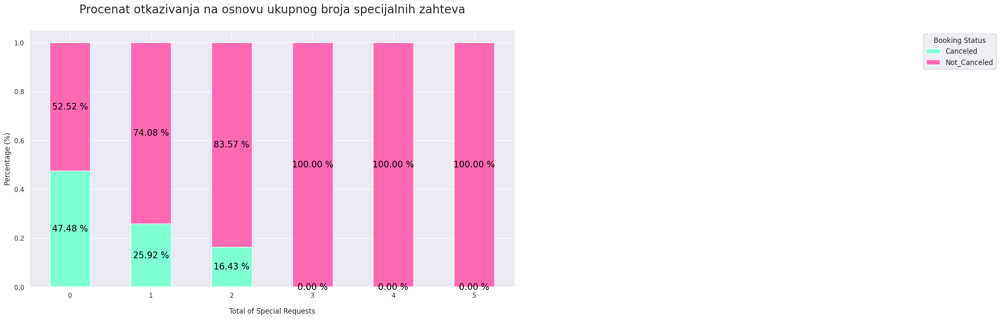

In [ ]:
c = ['aquamarine', 'hotpink']

request_ax = pd.crosstab(df['no_of_special_requests'], df['booking_status'], normalize = 'index').plot.bar(stacked=True, figsize=(15,8), color=c)
plt.legend(bbox_to_anchor=(2, 1), title='Booking Status', fontsize=12, title_fontsize=12)
    
for p in request_ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    request_ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center',
            color='black', fontsize=15)
    
plt.title('Procenat otkazivanja na osnovu ukupnog broja specijalnih zahteva', fontsize=20, pad=30)    
plt.xticks(rotation=360)
plt.xlabel('Total of Special Requests', fontsize=12, labelpad=15)
plt.ylabel('Percentage (%)', fontsize=12)
plt.show()
sb.set_style("darkgrid")

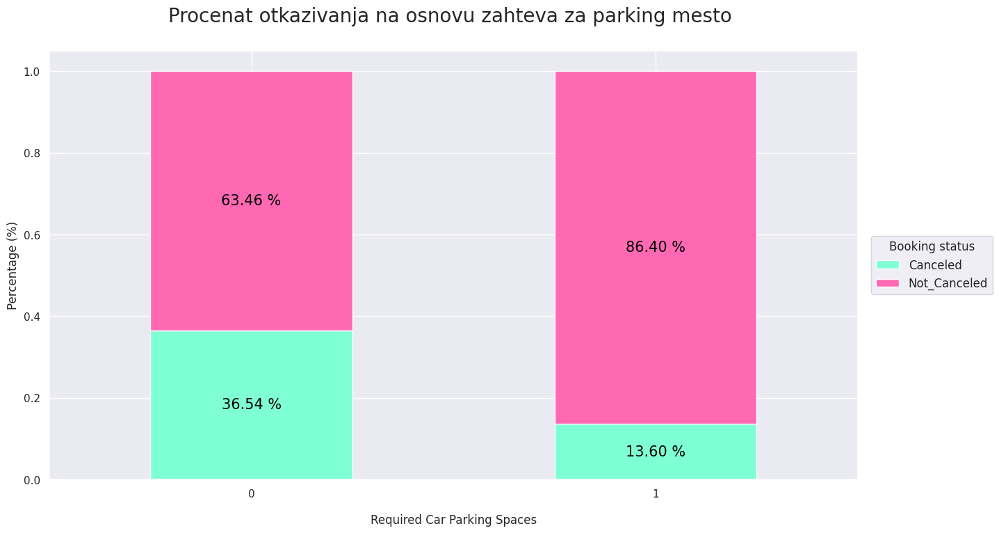

In [ ]:
c = ['aquamarine', 'hotpink']

parking_ax = pd.crosstab(df['required_car_parking_space'], df['booking_status'], normalize = 'index').plot.bar(stacked=True, figsize=(15,8),color=c)
plt.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), title='Booking status', fontsize=12, title_fontsize=12)

j = 1    
for p in parking_ax.patches:
    if j < 7:
      width, height = p.get_width(), p.get_height()
      x, y = p.get_xy() 
      parking_ax.text(x+width/2, 
              y+height/2, 
              '{:.2f} %'.format(height*100), 
              horizontalalignment='center', 
              verticalalignment='center',
              color='black', fontsize=15)
    j += 1
    
plt.title('Procenat otkazivanja na osnovu zahteva za parking mesto ', fontsize=20, pad=30)    
plt.xticks(rotation=360)
plt.xlabel('Required Car Parking Spaces', fontsize=12, labelpad=15)
plt.ylabel('Percentage (%)', fontsize=12)
plt.show()
sb.set_style("darkgrid")

## Konvertovanje kategorickih obelezja u numericka 🚧





In [ ]:
labelEncoder=LabelEncoder()
df['Booking_ID']=labelEncoder.fit_transform(df['Booking_ID'])

In [ ]:
labelEncoder=LabelEncoder()
df['type_of_meal_plan']=labelEncoder.fit_transform(df['type_of_meal_plan'])

In [ ]:
df['type_of_meal_plan'].unique()

array([0, 3, 1, 2])

In [ ]:
labelEncoder=LabelEncoder()
df['room_type_reserved']=labelEncoder.fit_transform(df['room_type_reserved'])

In [ ]:
df['room_type_reserved'].unique()

array([0, 3, 5, 4, 1, 6, 2])

In [ ]:
labelEncoder=LabelEncoder()
df['market_segment_type']=labelEncoder.fit_transform(df['market_segment_type'])

In [ ]:
df['booking_status'].unique()

array(['Not_Canceled', 'Canceled'], dtype=object)

In [ ]:
status_map = {"Canceled": 1, "Not_Canceled": 0}
df["booking_status"] = df["booking_status"].map(status_map)
print(df["booking_status"])

0        0
1        0
3        1
4        1
5        1
        ..
36270    0
36271    1
36272    0
36273    1
36274    0
Name: booking_status, Length: 31338, dtype: int64


In [ ]:
print('Procenat neotkazano:',((len(df.loc[(df['booking_status']==0)]))/(len(df))) * 100,'%')

Procenat neotkazano: 64.06918118578085 %


In [ ]:
print('Procenat otkazano',((len(df.loc[(df['booking_status']==1)]))/(len(df))) * 100,'%')

Procenat otkazano 35.93081881421916 %


In [ ]:
df.describe()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
count,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00,31338.00
mean,15668.50,1.89,0.10,0.85,2.32,0.50,0.03,0.72,94.43,2017.83,7.49,15.53,3.60,0.01,0.01,0.07,105.23,0.62,0.36
std,9046.65,0.49,0.37,0.88,1.41,1.03,0.16,1.40,81.53,0.37,3.01,8.78,0.59,0.11,0.26,1.16,32.17,0.79,0.48
min,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2017.00,1.00,1.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00
25%,7834.25,2.00,0.00,0.00,1.00,0.00,0.00,0.00,30.00,2018.00,5.00,8.00,3.00,0.00,0.00,0.00,81.50,0.00,0.00
50%,15668.50,2.00,0.00,1.00,2.00,0.00,0.00,0.00,70.00,2018.00,8.00,16.00,4.00,0.00,0.00,0.00,100.00,0.00,0.00
75%,23502.75,2.00,0.00,2.00,3.00,0.00,0.00,0.00,139.00,2018.00,10.00,23.00,4.00,0.00,0.00,0.00,120.70,1.00,1.00
max,31337.00,4.00,3.00,7.00,17.00,3.00,1.00,6.00,361.00,2018.00,12.00,31.00,4.00,1.00,13.00,58.00,540.00,5.00,1.00


Matrica konfuzije

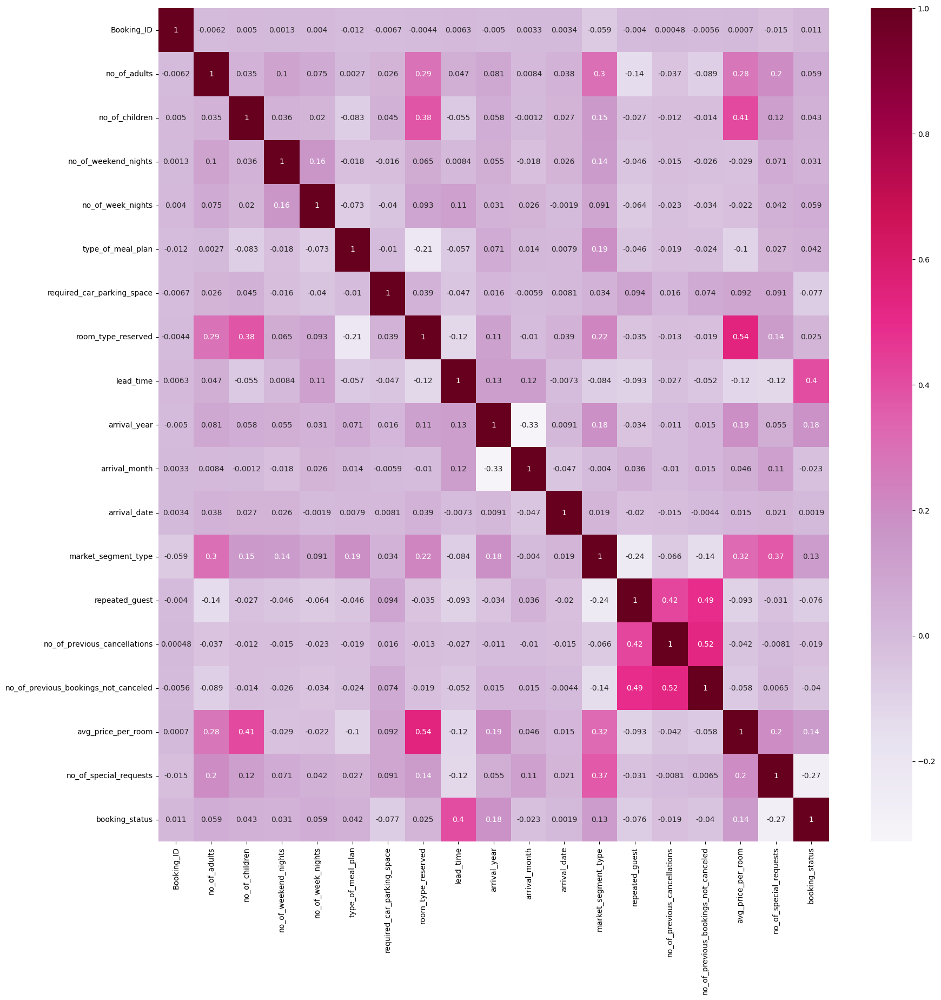

In [ ]:
corr_mat = df.corr()
plt.figure(figsize=(20,20))
sb.heatmap(corr_mat, annot=True,cmap='PuRd')
plt.show()

In [ ]:
correlation = df.corr()['booking_status'].sort_values(ascending = False)
correlation

booking_status                          1.00
lead_time                               0.40
arrival_year                            0.18
avg_price_per_room                      0.14
market_segment_type                     0.13
no_of_adults                            0.06
no_of_week_nights                       0.06
no_of_children                          0.04
type_of_meal_plan                       0.04
no_of_weekend_nights                    0.03
room_type_reserved                      0.02
Booking_ID                              0.01
arrival_date                            0.00
no_of_previous_cancellations           -0.02
arrival_month                          -0.02
no_of_previous_bookings_not_canceled   -0.04
repeated_guest                         -0.08
required_car_parking_space             -0.08
no_of_special_requests                 -0.27
Name: booking_status, dtype: float64

In [ ]:
cor = (df.corr()**2)**0.5
cor_mat = cor["booking_status"].sort_values(ascending=True)
cor_mat*100

arrival_date                             0.19
Booking_ID                               1.06
no_of_previous_cancellations             1.88
arrival_month                            2.30
room_type_reserved                       2.45
no_of_weekend_nights                     3.10
no_of_previous_bookings_not_canceled     4.05
type_of_meal_plan                        4.24
no_of_children                           4.28
no_of_week_nights                        5.89
no_of_adults                             5.93
repeated_guest                           7.59
required_car_parking_space               7.68
market_segment_type                     13.04
avg_price_per_room                      13.72
arrival_year                            17.79
no_of_special_requests                  27.19
lead_time                               39.86
booking_status                         100.00
Name: booking_status, dtype: float64

Izbacivanje BOOKING ID 





In [ ]:
df.drop(['Booking_ID'], inplace= True, axis = 1)


In [ ]:
vrsta=df.shape[0] # uzorci
kolona=df.shape[1] # obelezja
print("Broj vrsta:",vrsta)
print("Broj kolona:",kolona)

Broj vrsta: 31338
Broj kolona: 18




## Smanjenje dimenzionalnosti ✂️



## PCA 🧮


In [ ]:
X = df.iloc[:,0:17]
y = df.iloc[:,17]
print(y)

0        0
1        0
3        1
4        1
5        1
        ..
36270    0
36271    1
36272    0
36273    1
36274    0
Name: booking_status, Length: 31338, dtype: int64


In [ ]:
df.shape


(31338, 18)

In [ ]:
scaler = StandardScaler()
X_std=scaler.fit_transform(X)
X_std



array([[ 0.22889573, -0.26061664,  0.17434417, ..., -0.0560503 ,
        -1.25049097, -0.79028999],
       [ 0.22889573, -0.26061664,  1.31449393, ..., -0.0560503 ,
         0.04499493,  0.47645379],
       [ 0.22889573, -0.26061664, -0.96580559, ..., -0.0560503 ,
        -0.16263093, -0.79028999],
       ...,
       [ 0.22889573, -0.26061664,  1.31449393, ..., -0.0560503 ,
        -0.21267249,  1.74319757],
       [ 0.22889573, -0.26061664, -0.96580559, ..., -0.0560503 ,
        -0.33358036, -0.79028999],
       [ 0.22889573, -0.26061664,  0.17434417, ..., -0.0560503 ,
         1.75417848, -0.79028999]])

In [ ]:
pca = PCA(n_components=17)
pca.fit(X_std)




PCA(n_components=17)

In [ ]:
var=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3)*100)
var

array([15.2, 26.7, 34.7, 42.5, 50. , 56.1, 61.9, 67.6, 72.9, 77.7, 82.3,
       86. , 89.4, 92.2, 94.8, 97.4, 99.7])

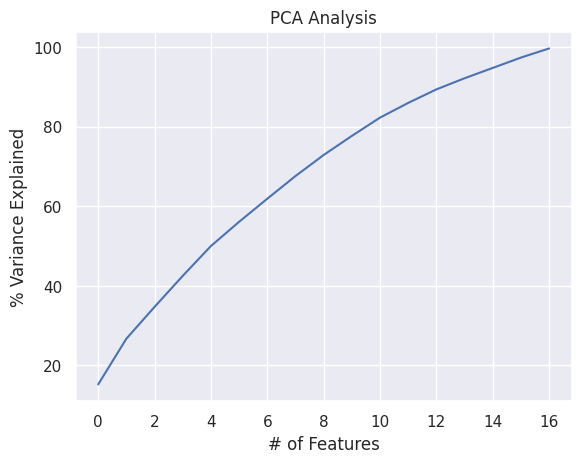

In [ ]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.style.context('seaborn-whitegrid')

plt.plot(var)

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train.shape

(25070, 17)

In [ ]:
# SA PCA

s = StandardScaler()
s.fit(X_train)
X_train_std = s.transform(X_train)
X_test_std = s.transform(X_test)

pca = PCA(n_components='mle')  
pca.fit(X_train_std)
X_train_r = pca.fit_transform(X_train_std)  
X_test_r = pca.transform(X_test_std)

print('Dimenzije redukovanog prostora: ', pca.n_components_)

Dimenzije redukovanog prostora:  16


## LOGICKA REGRESIJA 💻
Pre smanjenja dimenzionalnosti

In [ ]:
def evaluation_classifier(conf_mat):
    
    tp = conf_mat[0,0]
    tn = conf_mat[1,1]
    fp = conf_mat[0,1]
    fn = conf_mat[1,0]

    precision = tp/(tp+fp)
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    sensitivity = tp/(tp+fn)
    specificity =tn/(tn+fp)
    F_score = 2*precision*sensitivity/(precision+sensitivity)
    
    print('Tacnost: ', accuracy)
    print('Preciznost: ', precision)
    print('Osetljivost: ', sensitivity)
    print('specificnost: ', specificity)
    print('F mera: ', F_score)

In [ ]:
X = df.iloc[:,0:17]
y = df.iloc[:,17]

X_obuka, X_test, y_obuka, y_test=train_test_split(X, y, test_size=0.2,random_state=42)

In [ ]:
#Logistic Regression
logreg = LogisticRegression(max_iter=70000).fit(X_obuka, y_obuka)
scores = cross_val_score(logreg, X_obuka, y_obuka, cv=5)
y_pred = logreg.predict(X_test)
print("Prosecni krosvalidacioni rezultat: {:.3f}".format(scores.mean()))
print("Test tacnost: {:.3f}".format(logreg.score(X_test, y_test)))
print("F1 score: {:.3f}".format(f1_score(y_test, y_pred)))
print(confusion_matrix(y_test, y_pred))

Prosecni krosvalidacioni rezultat: 0.787
Test tacnost: 0.789
F1 score: 0.692
[[3466  526]
 [ 794 1482]]


In [ ]:
acc_lr = accuracy_score(y_test, y_pred)


In [ ]:
print('Rezultat obuke: ' + str(logreg.score(X_obuka, y_obuka))) #accuracy
print('Rezultat testa:' + str(logreg.score(X_test, y_test))) #accuracy

Rezultat obuke: 0.785081771041085
Rezultat testa:0.7894065092533503


In [ ]:
def eval_classification(model, pred, xtrain, ytrain, xtest, ytest):
    print("Tacnost (Test Set): %.2f" % accuracy_score(ytest, pred))
    print("Preciznost (Test Set): %.2f" % precision_score(ytest, pred))
    print("Recall (Test Set): %.2f" % recall_score(ytest, pred))
    print("F1-Score (Test Set): %.2f" % f1_score(ytest, pred))
    
    fpr, tpr, thresholds = roc_curve(ytest, pred, pos_label=1)
    print("AUC: %.2f" % auc(fpr, tpr))

In [ ]:
eval_classification(logreg, y_pred, X_obuka, y_obuka, X_test, y_test)

Tacnost (Test Set): 0.79
Preciznost (Test Set): 0.74
Recall (Test Set): 0.65
F1-Score (Test Set): 0.69
AUC: 0.76


In [ ]:
recall_lr = recall_score(y_test, y_pred)
acc_lr = accuracy_score(y_test, y_pred)
precision_lr = precision_score(y_test, y_pred)
f1_lr = f1_score(y_test, y_pred)
acc_lr_train = logreg.score(X_obuka, y_obuka)

In [ ]:
def show_cmatrix(ytest, pred):
    # Kreiranje Matrice konfuzije
    cm = confusion_matrix(ytest, pred)
    cm_df = pd.DataFrame(cm, index=['Not Canceled', 'Canceled'],
                 columns=['Not Canceled', 'Canceled'])
# status_map = {"Canceled": 1, "Not_Canceled": 0}
    
    # Vizuelizacija
    sns.set(font_scale=1.2)
    plt.figure(figsize=(10,4))
        
    sns.heatmap(cm, annot=True, fmt='g', cmap="Reds",xticklabels=cm_df.columns, yticklabels=cm_df.index, annot_kws={"size": 20})

    
    #ax.xaxis.set_ticklabels(['Not Canceled', 'Canceled'])
    #ax.yaxis.set_ticklabels(['Not Canceled', 'Canceled'])
    plt.title("Matrica konfuzije", size=20)
    plt.xlabel('Klasa predvidjeno')
    plt.ylabel('Klasa True');

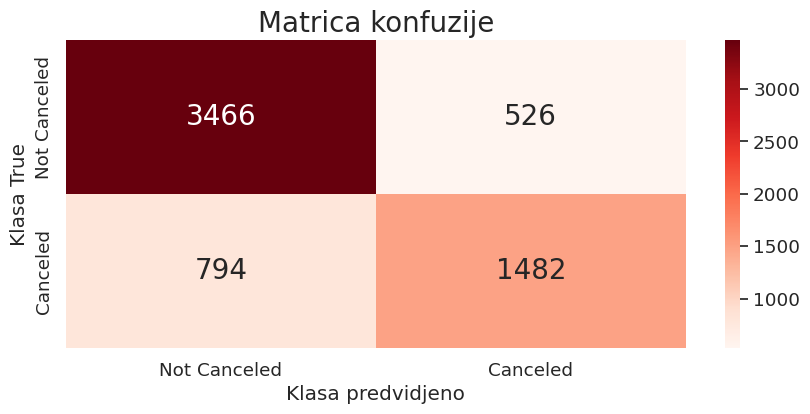

In [ ]:
disp=show_cmatrix(y_test, y_pred)

In [ ]:
vrsta=df.shape[0] # uzorci
kolona=df.shape[1] # obelezja
print("Broj vrsta:",vrsta)
print("Broj kolona:",kolona)

Broj vrsta: 31338
Broj kolona: 18


##LOGICKA REGRESIJA sa smanjenom dimenzionalnoscu 💻✂️


In [ ]:

X = df.iloc[:, :-1].copy()
y = df.iloc[:, -1].copy()


In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train.shape

s = StandardScaler()
s.fit(X_train)
X_train_std = s.transform(X_train)
X_test_std = s.transform(X_test)



pca = PCA(n_components='mle')  
pca.fit(X_train_std)
X_train_r = pca.fit_transform(X_train_std)  
X_test_r = pca.transform(X_test_std)


print('Dimenzije redukovanog prostora: ', pca.n_components_)

Dimenzije redukovanog prostora:  16


In [ ]:
#Logistic Regression!!!
logreg = LogisticRegression(max_iter=70000).fit(X_train_r, y_train)
scores = cross_val_score(logreg, X_train_r, y_train, cv=5)
y_pred_lr = logreg.predict(X_test_r)
print("Prosecan krosvalidacioni rezultat: {:.3f}".format(scores.mean()))
print("Test tacnost: {:.3f}".format(logreg.score(X_test_r, y_test)))
print("F1 rezultat: {:.3f}".format(f1_score(y_test, y_pred_lr)))
print(confusion_matrix(y_test, y_pred_lr))

Prosecan krosvalidacioni rezultat: 0.790
Test tacnost: 0.807
F1 rezultat: 0.708
[[3598  509]
 [ 698 1463]]


In [ ]:
acc_lr_pca = accuracy_score(y_test, y_pred_lr)

In [ ]:
print('Rezultat obuke: ' + str(logreg.score(X_train_r, y_train))) #accuracy
print('Rezultat testa:' + str(logreg.score(X_test_r, y_test))) #accuracy

Rezultat obuke: 0.789270043877144
Rezultat testa:0.8074345883854499


In [ ]:
eval_classification(logreg, y_pred_lr, X_train_r, y_train, X_test_r, y_test)

Tacnost (Test Set): 0.81
Preciznost (Test Set): 0.74
Recall (Test Set): 0.68
F1-Score (Test Set): 0.71
AUC: 0.78


In [ ]:
recall_lr = recall_score(y_test, y_pred_lr)
acc_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
acc_lr_train = logreg.score(X_train_r, y_train)


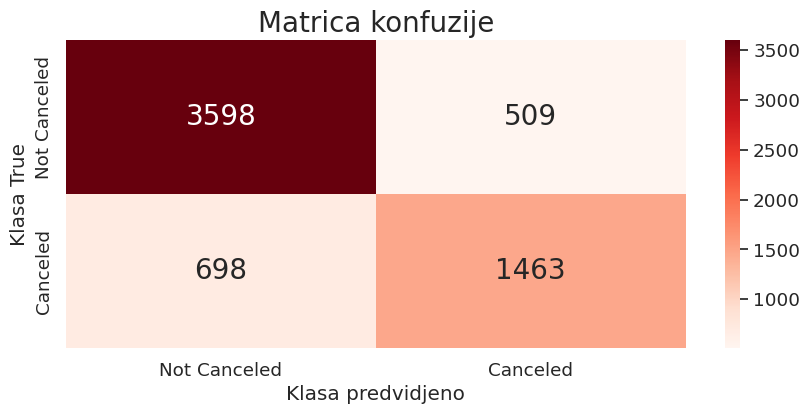

In [ ]:
disp=show_cmatrix(y_test, y_pred_lr)



# KNN klasifikator 🧶


Bez smanjenja dimenzionalnosti

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
X = df.iloc[:, :-1].copy()
y = df.iloc[:, -1].copy()


Podela uzoraka na dva skupa - za obuku i test


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=11, stratify=y)

U okviru skupa za obuku - izvrsena je krosvalidacija sa 10 podskupova radi pretrage optimalnih parametara modela KNeighborsClassifier.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

parameters = {'metric':['euclidean','hamming','manhattan'], 'n_neighbors':[1,3,5,7,9,11,13]}

knn = KNeighborsClassifier()
clf = GridSearchCV(estimator=knn, param_grid=parameters, scoring='accuracy', cv=kfold, refit=True, verbose=3)
clf.fit(X_train, y_train)

print(clf.best_score_)
print(clf.best_params_)

Fitting 10 folds for each of 21 candidates, totalling 210 fits
[CV 1/10] END ..metric=euclidean, n_neighbors=1;, score=0.781 total time=   0.4s
[CV 2/10] END ..metric=euclidean, n_neighbors=1;, score=0.779 total time=   0.4s
[CV 3/10] END ..metric=euclidean, n_neighbors=1;, score=0.797 total time=   0.3s
[CV 4/10] END ..metric=euclidean, n_neighbors=1;, score=0.783 total time=   0.4s
[CV 5/10] END ..metric=euclidean, n_neighbors=1;, score=0.797 total time=   0.3s
[CV 6/10] END ..metric=euclidean, n_neighbors=1;, score=0.791 total time=   0.3s
[CV 7/10] END ..metric=euclidean, n_neighbors=1;, score=0.797 total time=   0.4s
[CV 8/10] END ..metric=euclidean, n_neighbors=1;, score=0.785 total time=   0.4s
[CV 9/10] END ..metric=euclidean, n_neighbors=1;, score=0.791 total time=   0.4s
[CV 10/10] END .metric=euclidean, n_neighbors=1;, score=0.789 total time=   0.3s
[CV 1/10] END ..metric=euclidean, n_neighbors=3;, score=0.775 total time=   0.3s
[CV 2/10] END ..metric=euclidean, n_neighbors=

In [ ]:
kf = StratifiedKFold(n_splits=10,shuffle=True, random_state=42)
indexes = kf.split(X_train, y_train)
acc = []
for k in [1, 5, 7, 11,13]:
    for m in ['euclidean', 'hamming']:
        indexes = kf.split(X_train, y_train)
        acc_tmp = []
        fin_conf_mat = np.zeros((len(np.unique(y)),len(np.unique(y))))
        for train_index, test_index in indexes:



            Xfold_train = X_train.iloc[train_index,:]
            yfold_train = y_train.iloc[train_index]

            Xfold_test = X_train.iloc[test_index,:]
            yfold_test = y_train.iloc[test_index]


            classifier = KNeighborsClassifier(n_neighbors=k, metric=m)

            classifier.fit(Xfold_train, yfold_train)


            y_pred = classifier.predict(Xfold_test)

            acc_tmp.append(accuracy_score(yfold_test, y_pred))

            fin_conf_mat += confusion_matrix(yfold_test, y_pred)

        print('za parametre k=', k, ' i m=', m, ' tacnost je: ', np.mean(acc_tmp), ' a mat. konf. je:')
        print(fin_conf_mat)
        acc.append(np.mean(acc_tmp))
print('najbolja tacnost je u iteraciji broj: ', np.argmax(acc))

za parametre k= 1  i m= euclidean  tacnost je:  0.7891104906262465  a mat. konf. je:
[[13359.  2703.]
 [ 2584.  6424.]]
za parametre k= 1  i m= hamming  tacnost je:  0.8075388911049064  a mat. konf. je:
[[13465.  2597.]
 [ 2228.  6780.]]
za parametre k= 5  i m= euclidean  tacnost je:  0.7863581970482649  a mat. konf. je:
[[14001.  2061.]
 [ 3295.  5713.]]
za parametre k= 5  i m= hamming  tacnost je:  0.8118069405664141  a mat. konf. je:
[[13861.  2201.]
 [ 2517.  6491.]]
za parametre k= 7  i m= euclidean  tacnost je:  0.7834064619066613  a mat. konf. je:
[[14143.  1919.]
 [ 3511.  5497.]]
za parametre k= 7  i m= hamming  tacnost je:  0.8130035899481453  a mat. konf. je:
[[13925.  2137.]
 [ 2551.  6457.]]
za parametre k= 11  i m= euclidean  tacnost je:  0.7830474670921419  a mat. konf. je:
[[14378.  1684.]
 [ 3755.  5253.]]
za parametre k= 11  i m= hamming  tacnost je:  0.8151974471479857  a mat. konf. je:
[[13993.  2069.]
 [ 2564.  6444.]]
za parametre k= 13  i m= euclidean  tacnost je

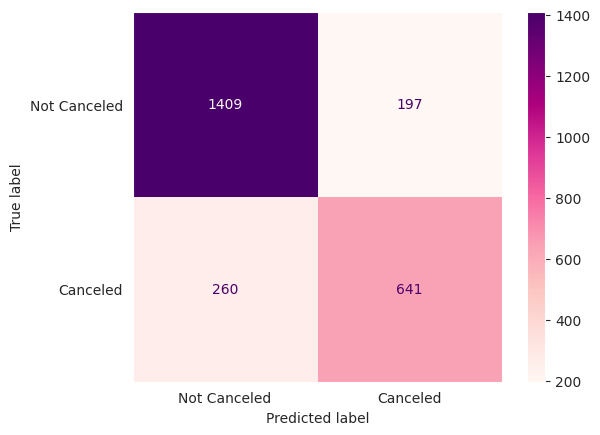

Tacnost:  0.817710410849621
Preciznost:  0.8773349937733499
Osetljivost:  0.8442180946674656
specificnost:  0.7649164677804295
F mera:  0.8604580152671756


In [ ]:
metric = 'hamming'
k = 13
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = list(kfold.split(X_train, y_train))
conf_mat =  np.zeros((len(np.unique(y)),len(np.unique(y))))

for train_index, test_index in indexes:

  Xfold_train = X_train.iloc[train_index,:]
  yfold_train = y_train.iloc[train_index]

  Xfold_test = X_train.iloc[test_index,:]
  yfold_test = y_train.iloc[test_index]

  knn = KNeighborsClassifier(n_neighbors=k, metric=metric)
  knn.fit(Xfold_train, yfold_train)

  yfold_pred = knn.predict(Xfold_test)

  conf_mat = confusion_matrix(yfold_test, yfold_pred)  


disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap="RdPu")

#ConfusionMatrixDisplay.from_predictions(y_true=y_test, y_pred=y_pred, cmap=plt.cm.Blues)
plt.grid(None)
plt.show()

evaluation_classifier(conf_mat)

Tacnost:  0.813018506700702
Preciznost:  0.875
Osetljivost:  0.8398661567877629
specificnost:  0.7591170825335892
F mera:  0.8570731707317072


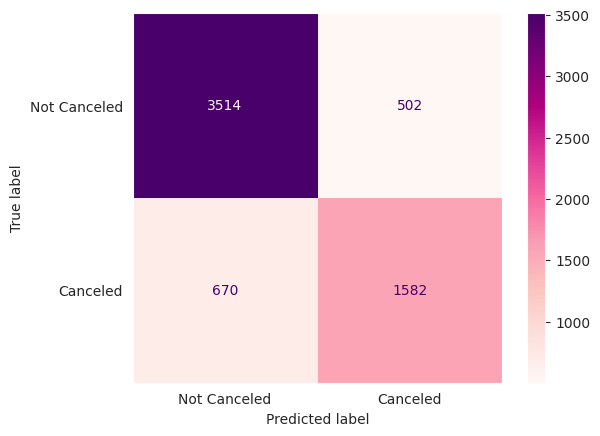

In [ ]:
k =13
metric = 'hamming'


knn = KNeighborsClassifier(n_neighbors=k, metric=metric)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)


conf_mat = confusion_matrix(y_test, y_pred, labels=knn.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap="RdPu")
plt.grid(None)


evaluation_classifier(conf_mat)



In [ ]:
acc_knn = accuracy_score(y_test, y_pred)

# KNN klasifikator sa smanjenom dimenzionalnoscu 🧶

In [ ]:
X = df.iloc[:, :-1].copy()
y = df.iloc[:, -1].copy()


In [ ]:
# Podela podataka na skup za obuku i skup za testiranje
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
s = StandardScaler()
s.fit(X_train)
X_train_std = s.transform(X_train)
X_test_std = s.transform(X_test)

pca = PCA(n_components='mle')
pca.fit(X_train_std)
X_train_r = pca.transform(X_train_std)
X_test_r = pca.transform(X_test_std)
print('Dimenzije redukovanog prostora: ', pca.n_components_)


Dimenzije redukovanog prostora:  16


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# TODO
parameters = {'metric':['euclidean','hamming'], 'n_neighbors':[1,3,5,7,9,11,13]}

knn = KNeighborsClassifier()
clf = GridSearchCV(estimator=knn, param_grid=parameters, scoring='accuracy', cv=kfold, refit=True, verbose=3)
clf.fit(X_train_r, y_train)

print(clf.best_score_)
print(clf.best_params_)

Fitting 10 folds for each of 14 candidates, totalling 140 fits
[CV 1/10] END ..metric=euclidean, n_neighbors=1;, score=0.835 total time=   0.8s
[CV 2/10] END ..metric=euclidean, n_neighbors=1;, score=0.837 total time=   0.7s
[CV 3/10] END ..metric=euclidean, n_neighbors=1;, score=0.832 total time=   0.6s
[CV 4/10] END ..metric=euclidean, n_neighbors=1;, score=0.840 total time=   0.5s
[CV 5/10] END ..metric=euclidean, n_neighbors=1;, score=0.839 total time=   0.3s
[CV 6/10] END ..metric=euclidean, n_neighbors=1;, score=0.848 total time=   0.3s
[CV 7/10] END ..metric=euclidean, n_neighbors=1;, score=0.833 total time=   0.3s
[CV 8/10] END ..metric=euclidean, n_neighbors=1;, score=0.845 total time=   0.3s
[CV 9/10] END ..metric=euclidean, n_neighbors=1;, score=0.839 total time=   0.3s
[CV 10/10] END .metric=euclidean, n_neighbors=1;, score=0.830 total time=   0.3s
[CV 1/10] END ..metric=euclidean, n_neighbors=3;, score=0.839 total time=   0.3s
[CV 2/10] END ..metric=euclidean, n_neighbors=

X_train_r, X_test_r,

Tacnost:  0.8422144224633057
Preciznost:  0.8794820717131474
Osetljivost:  0.8749071092395343
specificnost:  0.7830569251456746
F mera:  0.8771886253570098


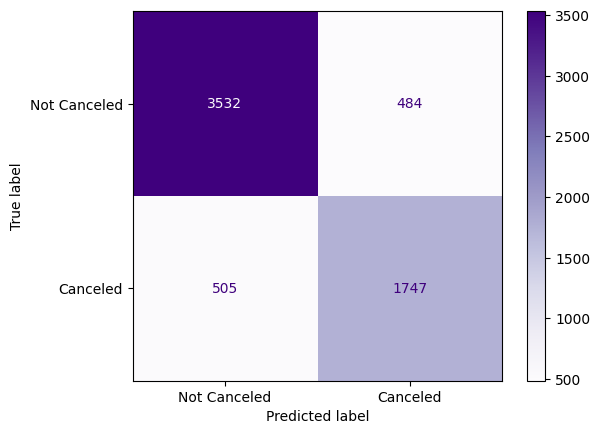

In [ ]:
k = 5
metric = 'euclidean'


knn = KNeighborsClassifier(n_neighbors=k, metric=metric)
knn.fit(X_train_r, y_train)

y_pred = knn.predict(X_test_r)


conf_mat = confusion_matrix(y_test, y_pred, labels=knn.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap='Purples')




evaluation_classifier(conf_mat)

In [ ]:
acc_knn_pca = accuracy_score(y_test, y_pred)

#  Stabla odluke 🌳 
Koren stabla predstavlja cvor koji sadrzi skup svih uzoraka. Od njega se stablo grana, odnosno vrsi se particija skupa uzoraka na dva disjunktna skupa, na osnovu vrednosti obelezja koje se proceni kao najznacajnije u datom trenutku. 
Postavlja se pitanje npr. da li je 'x1<a' gde je x jedno numericko obelezje,a jedna numericka vrednost.

Algoritam pronalazi optimalno pitanje na osnovu kojeg vrši particiju čvora prolaskom kroz skup mogućih pitanja i procenom u kojoj meri će čvorovi formirani na osnovu svakog od tih pitanja biti „čisti“. 


Kriterijum za zaustavljanje grananja može biti dobijanje potpuno čistog čvora, a može se zasnivati i na ograničenju u pogledu maksimalnog broja uzoraka u krajnjem čvoru ili maksimalne dubine stabla. 

Klasa test uzorka kod klasifikacionih problema najčešće određuje kao klasa koja
preovladava među uzorcima u listu.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

Kod klasifikacionih problema kriterijum podele može se zasnivati na vrednosti Ðinijevog indeksa (engl. Gini index), entropije, χ2-statistike, varijanse
i dr.



*   criterion: kriterijum podele; podrazumevana vrednost kod klasifikacionog stabla je gini, a može se odabrati i entropy;
*   max_depth: ako se ovaj parametar ne podesi, stablo se deli dok listovi ne
postanu potpuno čisti ili dok ne sadrže min_samples_split uzoraka.


*   min_samples_split: podrazumevana vrednost je 2; predstavlja minimalan broj uzoraka u čvoru da bi bilo dozvoljeno njegovo deljenje; ako
je vrednost celobrojna, predstavljaće broj uzoraka, a ako se specificira
necelobrojna vrednost između 0 i 1, ona će predstavljati udeo broja uzo-
raka.
*   max_features: predstavlja broj obeležja koja će stablo razmatrati pri
izboru najboljeg pitanja za podelu čvora; vrednost parametra može biti
None, log2, sqrt, auto ili konkretna numerička vrednost;





In [ ]:
X = df.iloc[:,0:17].copy()
Y = df.iloc[:,17].copy()

In [ ]:
print('Broj gostiju koji su otkazali rezervaciju: ',sum(Y==Y.unique()[1]))
print('Broj gostiju koji nisu otkazali rezervaciju: ',sum(Y==Y.unique()[0]))

Broj gostiju koji su otkazali rezervaciju:  11260
Broj gostiju koji nisu otkazali rezervaciju:  20078


In [ ]:
X1=X
Y1=Y
Y1.loc[Y==Y.unique()[0]]=0
Y1.loc[Y==Y.unique()[1]]=1
Y1.head()

0    0
1    0
3    1
4    1
5    1
Name: booking_status, dtype: int64

In [ ]:
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1, Y1, test_size=0.2, stratify=Y1, random_state=46)

[[1434  172]
 [ 233  668]]
[[1403  203]
 [ 217  684]]
[[1413  193]
 [ 250  651]]
[[1403  203]
 [ 250  651]]
[[1418  188]
 [ 251  650]]
[[1414  192]
 [ 240  661]]
[[1399  207]
 [ 225  676]]
[[1368  238]
 [ 238  663]]
[[1415  192]
 [ 257  643]]
[[1405  202]
 [ 247  653]]
finalna matrica za stablo odluke je: 
[[14072.  1990.]
 [ 2408.  6600.]]
procenat pogođenih uzoraka je:  82.45712006382129 %


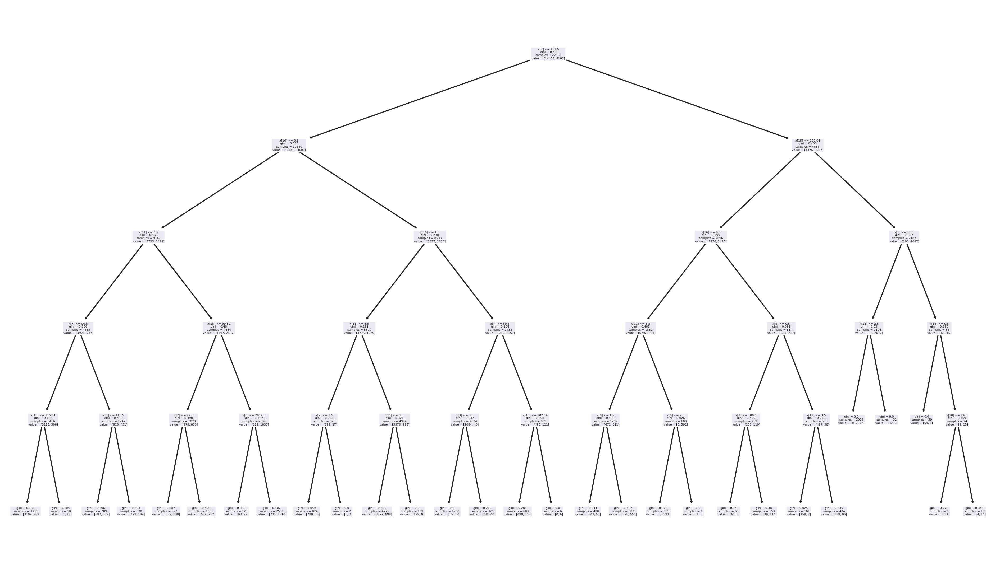

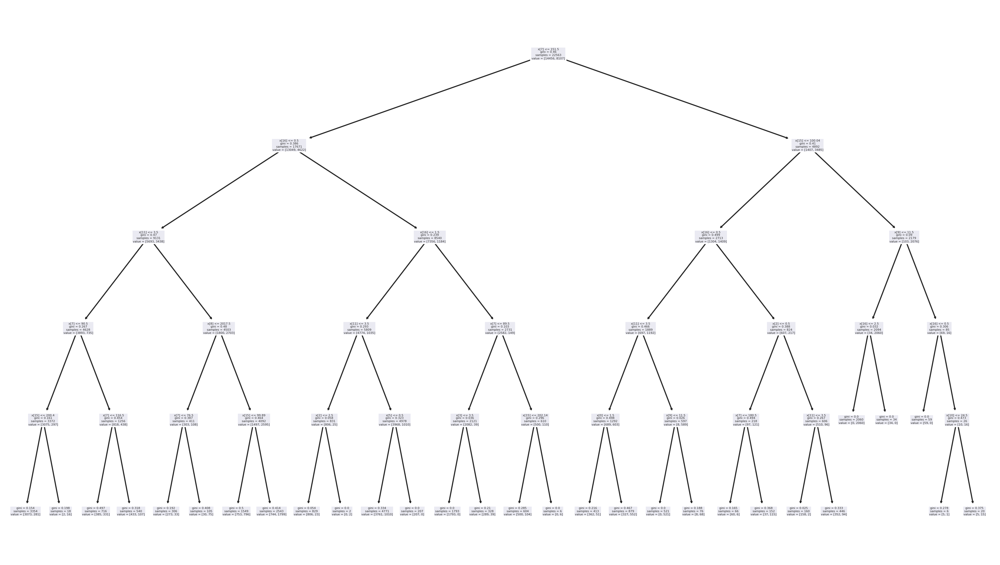

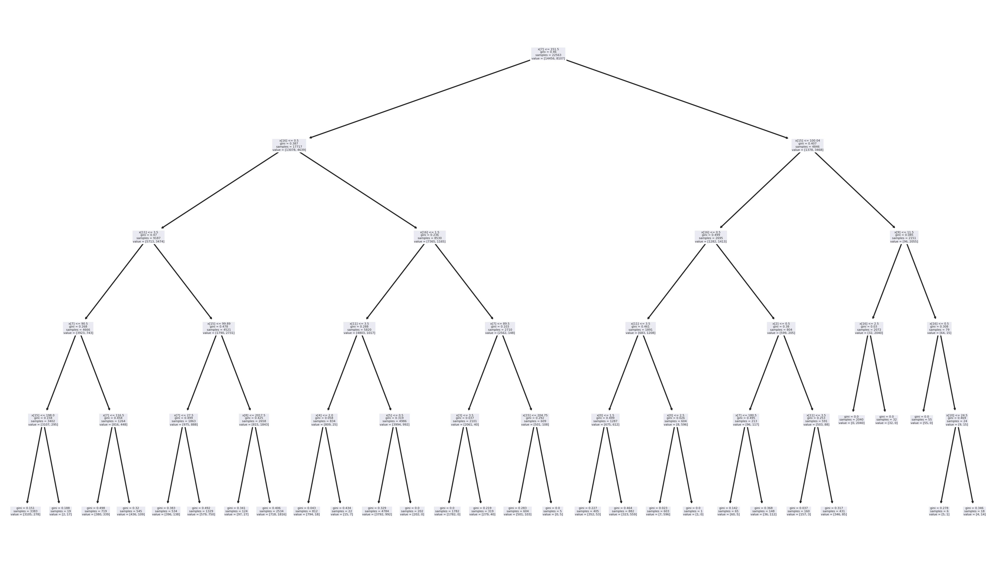

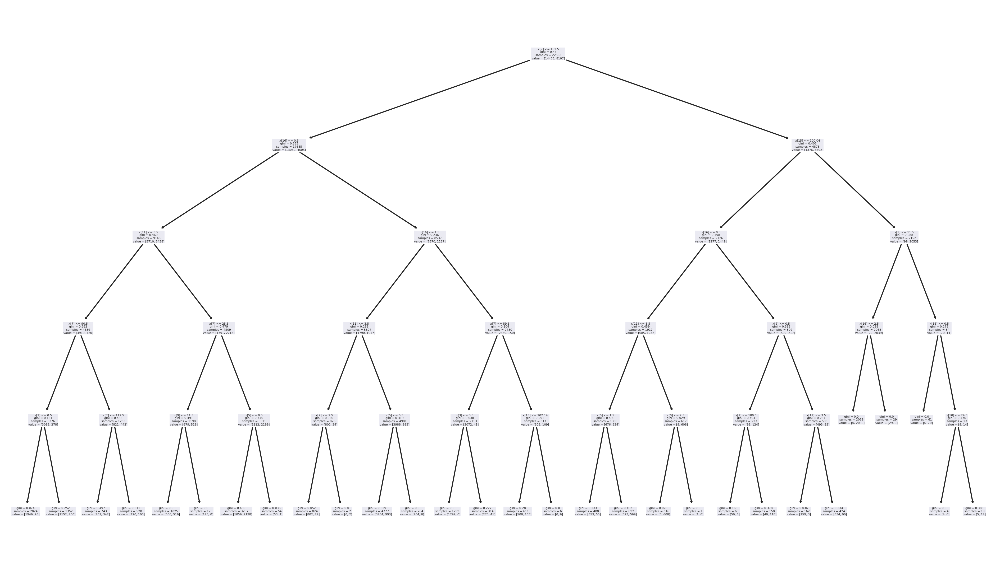

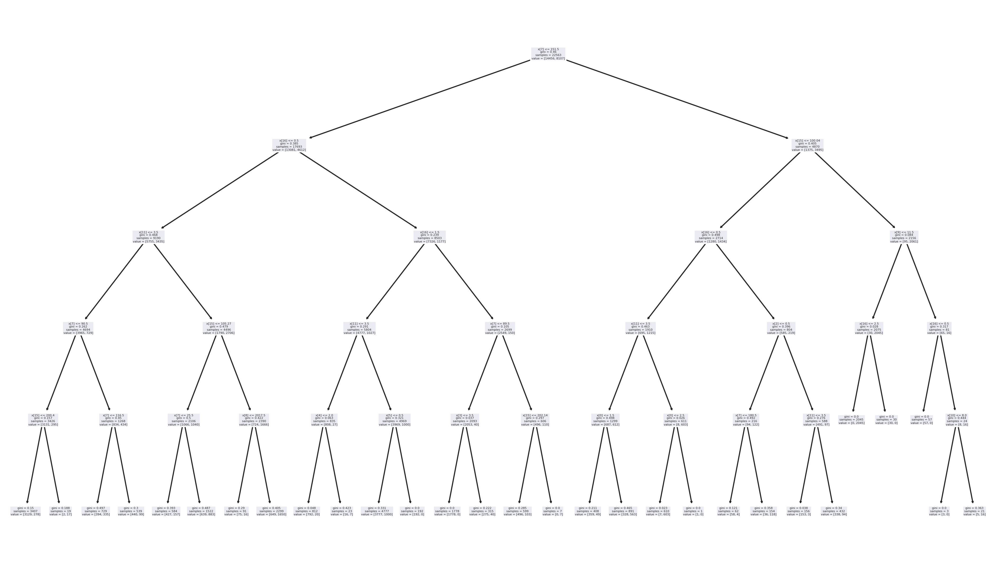

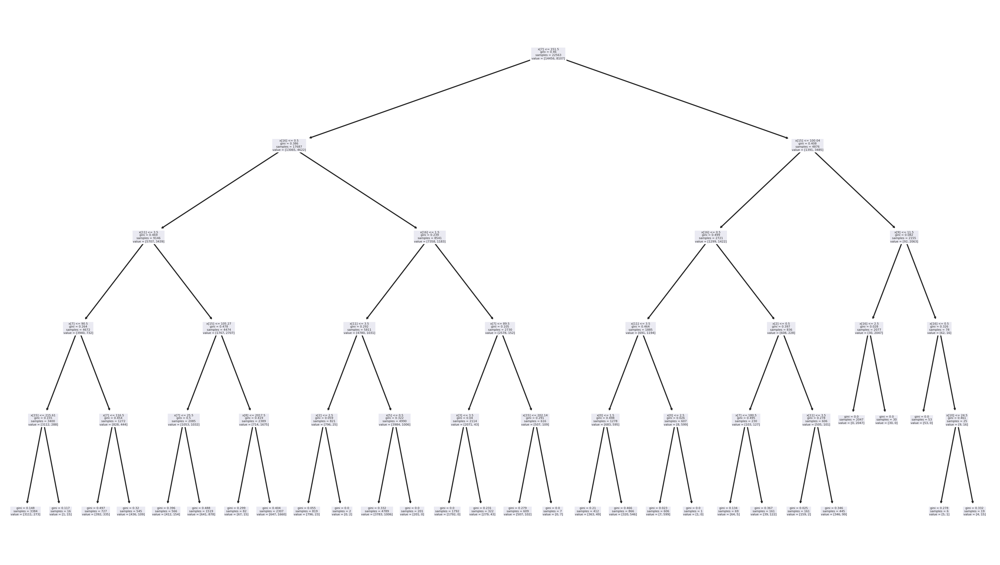

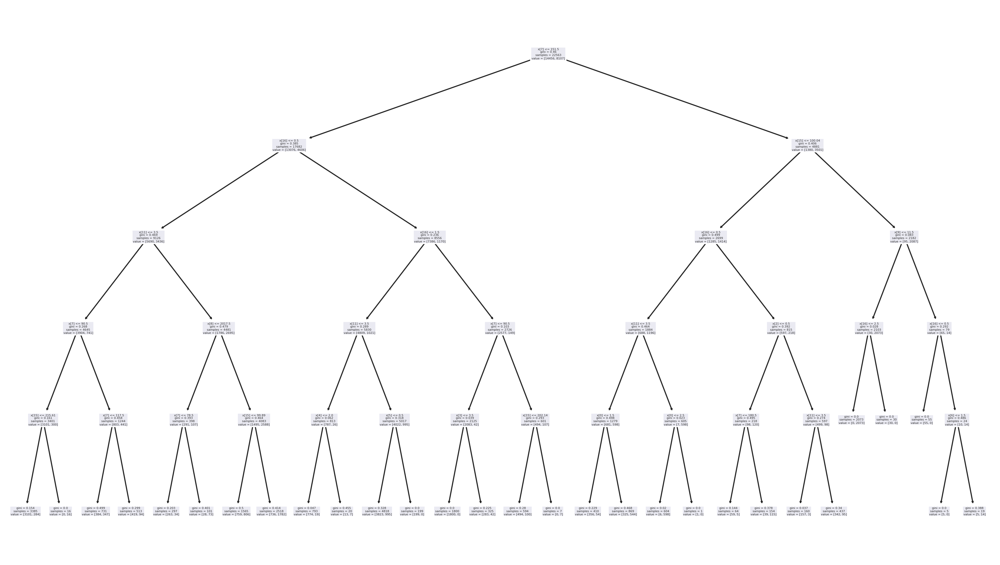

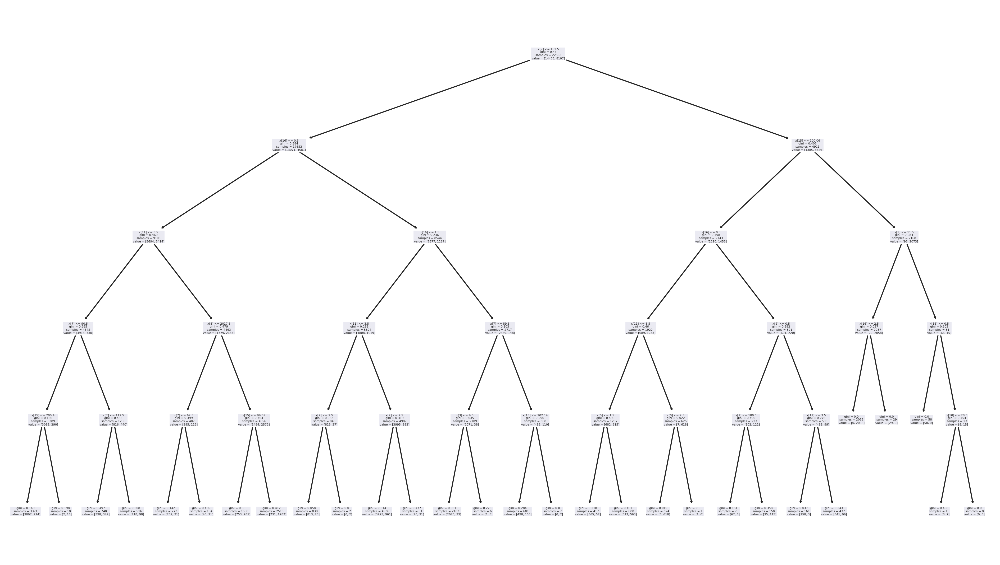

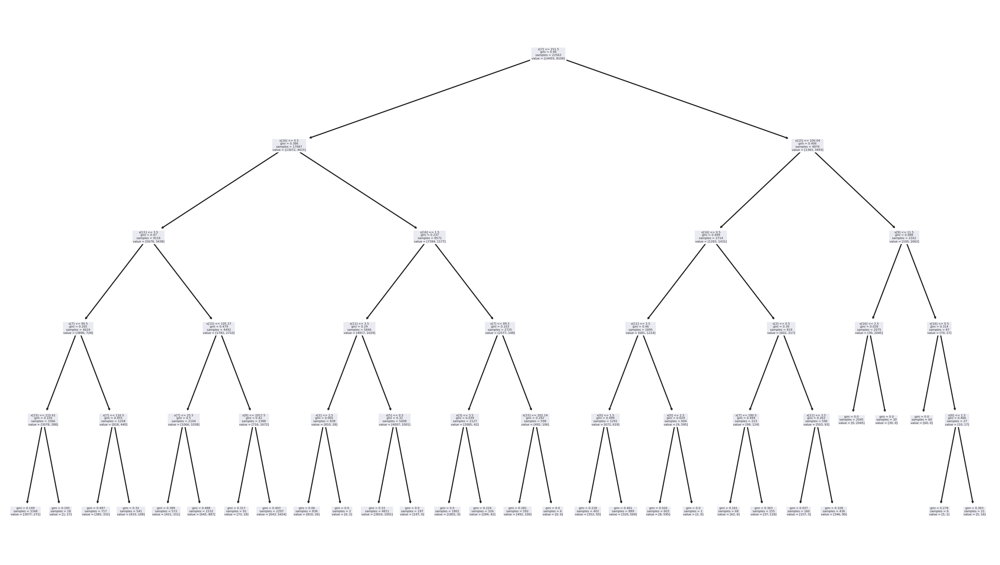

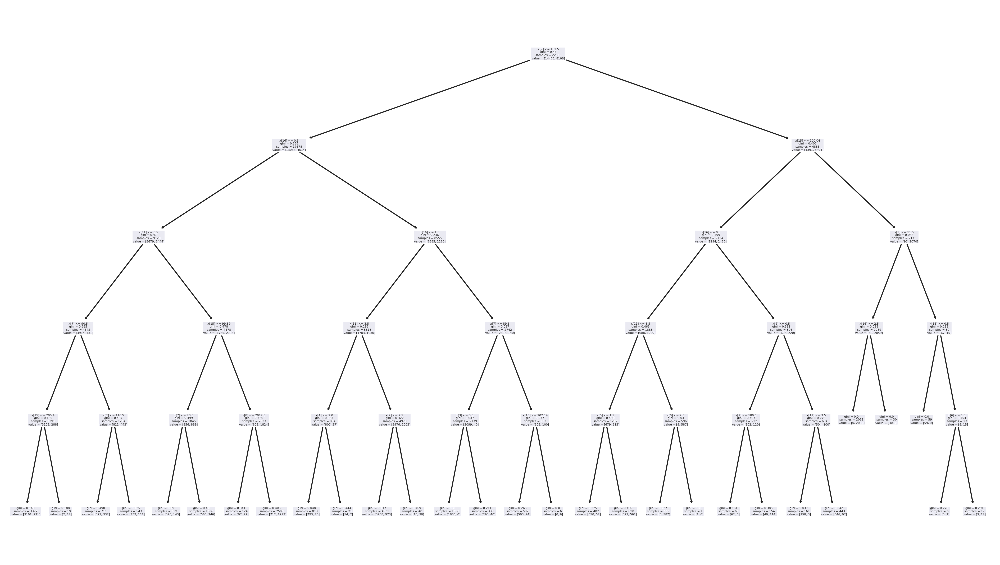

In [ ]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X1_train, Y1_train)

fin_conf_mat_dt = np.zeros((len(np.unique(Y1_train)),len(np.unique(Y1_train))))
for train_index, test_index in indexes:
    classifier = DecisionTreeClassifier(max_depth=5)
    classifier.fit(X1_train.iloc[train_index,:], Y1_train.iloc[train_index])
    plt.figure(figsize=(16,9), dpi=300)
    tree.plot_tree(classifier)
    Y_pred = classifier.predict(X1_train.iloc[test_index,:])
    conf_mat = confusion_matrix(Y1_train.iloc[test_index], Y_pred)
    print(conf_mat)
    fin_conf_mat_dt += conf_mat
print('finalna matrica za stablo odluke je: ')
print(fin_conf_mat_dt)
print('procenat pogođenih uzoraka je: ', np.trace(fin_conf_mat_dt)/sum(sum(fin_conf_mat_dt))*100, '%')

In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
indexes = kf.split(X1_train, Y1_train)

fin_conf_mat_rf = np.zeros((len(np.unique(Y1_train)),len(np.unique(Y1_train))))
for train_index, test_index in indexes:
    classifier = RandomForestClassifier(n_estimators=50, max_depth=5)
    classifier.fit(X1_train.iloc[train_index,:], Y1_train.iloc[train_index])
    Y_pred = classifier.predict(X1_train.iloc[test_index,:])
    conf_mat = confusion_matrix(Y1_train.iloc[test_index], Y_pred)
    print(conf_mat)

    fin_conf_mat_rf += conf_mat



print('finalna matrica za random forest je: ')
print(fin_conf_mat_rf)

print('procenat pogođenih uzoraka je: ', np.trace(fin_conf_mat_rf)/sum(sum(fin_conf_mat_rf))*100, '%')



[[3048  164]
 [ 686 1116]]
[[2955  257]
 [ 686 1116]]
[[2968  244]
 [ 637 1165]]
[[3048  165]
 [ 835  966]]
[[3008  205]
 [ 649 1152]]
finalna matrica za random forest je: 
[[15027.  1035.]
 [ 3493.  5515.]]
procenat pogođenih uzoraka je:  81.93857199840447 %


Tacnost:  0.8193857199840446
Preciznost:  0.9355621964886066
Osetljivost:  0.8113930885529158
specificnost:  0.8419847328244274
F mera:  0.8690648314151871


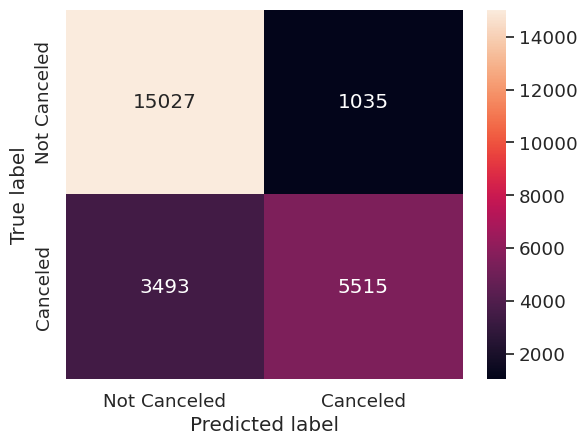

In [ ]:
x_axis_labels = ['Not Canceled','Canceled'] # labels for x-axis
y_axis_labels = ['Not Canceled','Canceled'] # labels for y-axis


s=sns.heatmap(fin_conf_mat_rf,annot=True, fmt='g',xticklabels=x_axis_labels, yticklabels=y_axis_labels)
s.set(xlabel='Predicted label',ylabel='True label')
evaluation_classifier(fin_conf_mat_rf)


In [ ]:
from sklearn.model_selection import GridSearchCV

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

parameters = {'criterion':('gini', 'entropy'), 'max_depth':[5,10,15], 
              'min_samples_split':[0.01, 0.05, 2], 'max_features':(None, 'log2', 'sqrt', 'auto'), 'class_weight':(None, 'balanced')}

dt = DecisionTreeClassifier()
clf=GridSearchCV(estimator=dt, param_grid=parameters, scoring='accuracy', cv=kfold, refit=True, verbose=3)
clf.fit(X1_train, Y1_train)

print(clf.best_score_)
print(clf.best_params_)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.836 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.829 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.820 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.815 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.822 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.828 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.805 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.654 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.782 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.745 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.808 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.804 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.782 total time=   0.0s
[CV 4/10] END class_weight=None, criteri

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.742 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.744 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.750 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.751 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.747 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.771 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.641 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.773 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.786 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.855 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.856 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.833 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.840 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.841 total time=   0.1s
[CV 6/10] END class_weight=None, criterio

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.803 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.810 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.752 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.822 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.767 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.769 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.801 total time=   0.0s
[CV 6/10] END class_weight=None, 

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.783 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.782 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.768 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.841 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.840 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.819 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.841 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gi

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.850 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.831 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.837 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.818 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.854 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.856 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.833 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gi

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.799 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.843 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.831 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.783 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.809 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.797 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.784 total time=   0.0s
[CV 5/10] END class_weight=None, 

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.797 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.768 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.777 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.780 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.791 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.861 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.868 total time=   0.0s
[CV 3/10] END class_weight=None, criter

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.872 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.841 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.835 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.828 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.819 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.817 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.822 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.827 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.810 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.818 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.819 total time=   0.0s
[CV 1/10] END class

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.664 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.776 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.751 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.767 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.744 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.753 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.671 total time=   0.0s
[CV 9/10] END class_

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.734 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.682 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.732 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.789 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.732 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.775 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.768 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.734 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.753 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.758 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.749 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.789 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.803 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.786 total time=   0.0s
[CV 5/10] END class_weight=None

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.761 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.763 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.777 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.746 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.765 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.847 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.854 total time=   0.1s
[CV 3/10] END class_weight=None,

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.814 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.765 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.803 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.832 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.768 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.798 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.823 total time=   0.0s
[CV 1/10] EN

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.822 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.738 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.786 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.763 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.780 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.764 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.747 total time=   0.0s
[CV 9/10] END

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.791 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.824 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.852 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.825 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.842 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.814 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.831 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.797 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.830 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.759 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.803 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.856 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.854 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.836 total time=   0.1s
[CV 4/10] END class_weig

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.834 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.786 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.808 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.840 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.828 total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.780 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.807 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.799 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.795 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.793 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.803 total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.798 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.782 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.788 total time=   0.0s
[CV 10/10] EN

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.862 total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.868 total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.861 total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.838 total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.849 total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.851 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.862 total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.850 total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.855 total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.850 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.825 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.829 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.813 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.813 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.825 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.817 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.811 total time=   0.1s
[CV 9/10] END

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.725 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.787 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.685 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.768 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.669 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.803 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.794 total time=   0.0s
[CV 4/10] EN

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.790 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.714 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.722 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.649 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.748 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.724 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.813 total time=   0.0s
[CV 3/10] END clas

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.776 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.799 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.722 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.783 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.711 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_split=2;, score=0.753 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.858 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.835 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.825 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.832 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.822 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.844 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.834 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.844 total time=   0.1s
[CV 9/

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.828 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.813 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.809 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.818 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.817 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.784 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.816 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.819 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.790 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.774 total time=   0.0s
[CV 3

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.806 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.771 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.758 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.792 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.789 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.780 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.838 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.761 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.828 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.809 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.752 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.826 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.850 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.831 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.799 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_split=2;, score=0.823 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.858 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.838 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.825 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.832 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.828 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.841 total time=   0.1s
[CV 7/10

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.826 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.828 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.817 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.811 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.811 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.806 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.830 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.778 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.812 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.811 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.777 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.788 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.781 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.790 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.805 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.826 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.781 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.755 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.813 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.771 total time=   0.0s
[CV 1

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.835 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.859 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.842 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.829 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_split=2;, score=0.818 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.836 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.830 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.819 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.815 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.819 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.821 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_split=0.01;, score=0.824 total time=

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.753 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.707 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.753 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.633 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.779 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.01;, score=0.674 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.742 total time

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.746 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.761 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.729 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.683 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.744 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.743 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=0.05;, score=0.748 total time

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.699 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.670 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.769 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.771 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.657 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.599 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_split=2;, score=0.762 total time=   0.0s
[CV 10/10] EN

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.855 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.820 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.827 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.835 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.827 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.846 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_split=0.01;, score=0.832 tota

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.799 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.798 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.829 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.814 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.822 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.01;, score=0.797 tot

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.761 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.641 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.786 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.782 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.789 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.794 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.726 tota

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.765 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.682 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=0.05;, score=0.747 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.812 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.800 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.832 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.810 total time=   0

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.828 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.846 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.840 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.810 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.835 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_split=2;, score=0.805 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.



[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.859 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.824 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.823 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.833 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.836 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.844 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_split=0.01;, score=0.839 tota

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.809 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.819 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.806 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.824 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.01;, score=0.811 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.746 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.797 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.781 total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.777 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.784 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.798 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.787 tota

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.773 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.786 total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=0.05;, score=0.736 total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.848 total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.864 total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.826 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.840 total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.853 total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.854 total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.848 total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.829 total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.864 total time=   0.0s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning:


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_split=2;, score=0.830 total time=   0.0s
0.8688472277622654
{'class_weight': None, 'criterion': 'gini', 'max_depth': 15, 'max_features': None, 'min_samples_split': 2}


[[3685  331]
 [ 460 1792]]
procenat pogođenih uzoraka je:  87.38034460753032 %
Tacnost:  0.8738034460753031
Preciznost:  0.9175796812749004
Osetljivost:  0.8890229191797346
specificnost:  0.8440885539331136
F mera:  0.9030756034799656


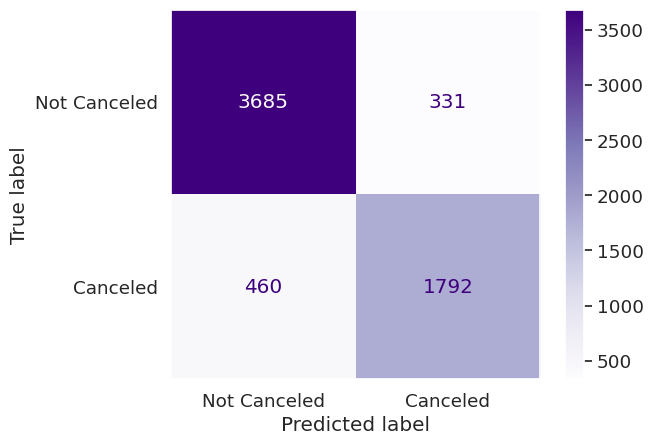

In [ ]:
dt = DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15, max_features=None, min_samples_split=2)

dt.fit(X1_train, Y1_train)
Y_pred=dt.predict(X1_test)
conf_mat = confusion_matrix(Y1_test, Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap='Purples')
print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
evaluation_classifier(conf_mat)
plt.grid(None)




In [ ]:
acc_dt = accuracy_score(Y1_test, Y_pred)

Random Forest

In [ ]:
X = df.iloc[:,0:17].copy()
Y = df.iloc[:,17].copy()

In [ ]:
X1=X
Y1=Y
Y1.loc[Y==Y.unique()[0]]=0
Y1.loc[Y==Y.unique()[1]]=1
Y1.head()

0    0
1    0
3    1
4    1
5    1
Name: booking_status, dtype: int64

In [ ]:
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1, Y1, test_size=0.2, stratify=Y1, random_state=46)

In [ ]:

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

parameters = {'criterion':('gini', 'entropy'), 'max_depth':[5, 10, 15], 
              'min_samples_split':[0.01,0.05,2], 'class_weight':(None, 'balanced'), 'n_estimators':[100,200,300]}

rf = RandomForestClassifier()
clf=GridSearchCV(estimator=rf,param_grid=parameters,scoring='accuracy',cv=kfold,refit=True,verbose=3)
clf.fit(X1_train, Y1_train)

print(clf.best_score_)
print(clf.best_params_)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.826 total time=   1.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.840 total time=   1.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.819 total time=   1.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.817 total time=   1.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.827 total time=   1.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.821 total time=   1.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_split=0.01, n_estimators=100;, score=0.832 to

[[3764  252]
 [ 424 1828]]
procenat pogođenih uzoraka je:  89.21506062539886 %
Tacnost:  0.8921506062539886
Preciznost:  0.9372509960159362
Osetljivost:  0.8987583572110793
specificnost:  0.8788461538461538
F mera:  0.9176011701608972


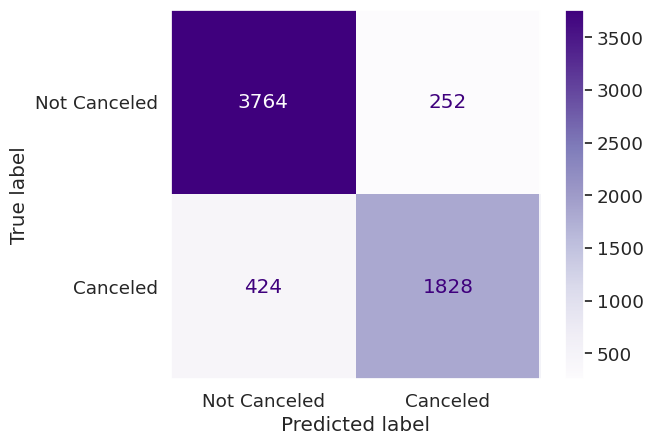

In [ ]:
dt = RandomForestClassifier(class_weight=None, criterion='gini', max_depth=15, min_samples_split=2, n_estimators=200)
dt.fit(X1_train, Y1_train)
Y_pred=dt.predict(X1_test)
conf_mat = confusion_matrix(Y1_test, Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap='Purples')
print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
evaluation_classifier(conf_mat)
plt.grid(None)

In [ ]:
acc_rf = accuracy_score(Y1_test, Y_pred)


# Stabla odluke sa smanjenom dimenzionalnoscu 🌳 ✂




In [ ]:
X = df.iloc[:,0:17].copy()
Y = df.iloc[:,17].copy()

In [ ]:
X1=X
Y1=Y
Y1.loc[Y==Y.unique()[0]]=0
Y1.loc[Y==Y.unique()[1]]=1
Y1.head()

0    0
1    0
3    1
4    1
5    1
Name: booking_status, dtype: int64

In [ ]:
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1, Y1, test_size=0.2, stratify=Y1, random_state=46)

In [ ]:
s = StandardScaler()
s.fit(X1_train)
X1_train_std = s.transform(X1_train)
X1_test_std = s.transform(X1_test)

pca = PCA(n_components='mle')  
pca.fit(X1_train_std)
X1_train_r = pca.fit_transform(X1_train_std)  
X1_test_r = pca.transform(X1_test_std)



print('Dimenzije redukovanog prostora: ', pca.n_components_)

Dimenzije redukovanog prostora:  16


In [ ]:
from sklearn.model_selection import GridSearchCV

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

parameters = {'criterion':('gini', 'entropy'), 'max_depth':[5,10,15,20],'min_samples_split' : [2,4,6,8], 'min_samples_leaf': [1,2,3,4,5],
              'min_samples_split':[0.01, 0.05, 2], 'max_features':(None, 'log2', 'sqrt', 'auto'), 'class_weight':(None, 'balanced')}
              
dt = DecisionTreeClassifier()
clf=GridSearchCV(estimator=dt, param_grid=parameters, scoring='accuracy', cv=kfold, refit=True, verbose=3)
clf.fit(X1_train_r, Y1_train)

print(clf.best_score_)
print(clf.best_params_)

Fitting 10 folds for each of 960 candidates, totalling 9600 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.4s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.776 total time=   0.3s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.763 total time=   0.3s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.753 total time=   0.4s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.759 total time=   0.4s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.768 total time= 

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.750 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.735 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.732 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.745 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.753 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.732 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.717 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.708 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.717 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.748 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.722 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.725 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.742 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.764 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.735 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.749 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.721 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.718 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.723 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.728 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.732 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.729 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.742 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.743 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.724 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.753 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.746 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9

[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.731 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.748 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.736 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.737 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.731 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.728 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.748 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.747 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.743 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.707 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.771 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.711 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.731 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.760 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.735 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.738 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.733 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.754 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.745 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.743 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.762 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.750 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.751 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.724 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.737 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.742 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.718 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.743 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.708 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.758 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.733 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.761 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.748 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.774 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.730 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.750 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.742 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.770 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.756 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.744 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.733 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.705 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.732 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.741 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.729 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.725 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.740 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.746 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.814 total time=   0.4s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.808 total time=   0.4s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.809 total time=   0.4s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, 

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.787 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.786 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.805 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.787 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.747 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.813 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.830 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.811 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.806 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.789 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.815 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.812 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.819 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.803 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.782 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.791 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.781 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.799 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.775 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.737 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.762 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.820 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.814 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.804 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.823 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.808 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.823 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.797 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.819 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.795 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.790 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.771 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.772 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.797 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.796 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.782 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.792 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.773 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.822 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.799 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.812 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.817 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.815 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.809 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.801 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.798 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.789 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.797 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.804 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.791 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.780 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.766 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.765 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.729 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.747 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.754 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.821 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.818 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.791 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.813 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.813 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.823 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.825 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.788 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.804 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.780 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.786 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.803 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.780 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.770 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.768 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.776 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.758 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.827 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.822 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.806 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.806 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.820 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.808 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.803 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.811 total time=   0.5s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.808 total time=   0.5s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.807 total time=   0.5s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.5s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.5s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.808 total time=   0.5s
[CV 7/10] END class_weight=None, criterion=gini, max

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.809 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.782 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.788 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.801 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.803 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.747 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.754 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.826 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.827 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.824 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.832 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.842 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.825 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.797 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.801 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.794 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.790 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.794 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.798 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.804 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.779 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.762 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.771 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.762 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.827 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.834 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.820 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.831 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.818 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.838 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.822 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.798 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.774 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.786 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.800 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.788 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.801 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.796 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.759 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.832 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.828 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.820 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.809 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.817 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.837 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.834 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.816 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.834 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.818 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.810 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.766 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.780 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.806 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.795 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.796 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.799 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.765 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.762 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.823 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.809 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.832 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.830 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.822 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.826 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.826 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.790 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.815 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.779 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.801 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.782 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.787 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.773 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.747 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.749 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.834 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.817 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.812 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.822 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.823 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.824 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.829 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.828 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.811 total time=   0.5s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.803 total time=   0.5s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.807 total time=   0.5s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.5s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.5s
[CV 6/10] END class_weight=None, criterion=gini, max_d

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.803 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.813 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.782 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.799 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.774 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.764 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.760 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.749 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.833 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.839 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.822 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.823 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.840 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.806 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.839 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.832 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.813 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.800 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.791 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.792 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.764 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.758 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.826 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.828 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.816 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.832 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.829 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.834 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.800 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.804 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.775 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.804 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.764 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.798 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.787 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.773 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.779 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.835 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.830 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.814 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.801 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.830 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.819 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.818 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.816 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.792 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.805 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.792 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.797 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.797 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.794 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.766 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.770 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.768 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.834 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.832 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.829 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.805 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.829 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.820 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.822 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.798 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.790 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.789 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.788 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.794 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.771 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.777 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.737 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.765 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.806 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.823 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.824 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.821 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.761 total time=   0.3s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.755 total time=   0.3s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.751 total time=   0.3s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.748 total time=   0.3s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.744 total time=   0.3s
[CV 6/10] END class_weight=None, criterion=e

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.726 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.741 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.742 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.746 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.706 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.730 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.704 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.716 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.719 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.711 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.766 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.765 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.758 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.736 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.742 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.761 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.742 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.718 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.719 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.740 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.730 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.745 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.712 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.746 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.773 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.757 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.737 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.745 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.722 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.745 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.718 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.742 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.717 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.724 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.749 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.729 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.738 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.732 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.708 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.745 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.758 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.727 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.744 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.719 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.711 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.754 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.741 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.705 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.775 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.737 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.743 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.732 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.703 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.678 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.733 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.722 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.750 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.742 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.730 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.739 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.721 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.747 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.754 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.738 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.695 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.718 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.732 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.759 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.741 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.715 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.702 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.702 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.737 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.745 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.738 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.754 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.746 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.725 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.708 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.749 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.816 total time=   0.5s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.813 total time=   0.5s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.5s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.790 total time=   0.5s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.5s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.805 total time=   0.5s
[CV 7/10] END class_weight=None, c

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.805 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.774 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.758 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.786 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.786 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.741 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.758 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.746 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.805 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.804 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.809 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.787 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.815 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.784 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.816 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.814 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.770 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.801 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.808 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.788 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.769 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.754 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.723 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.761 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.746 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.810 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.811 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.810 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.788 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.775 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.804 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.794 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.786 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.769 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.767 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.747 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.776 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.801 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.827 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.799 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.802 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.819 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.810 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.806 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.799 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.791 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.792 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.801 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.786 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.780 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.745 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.766 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.822 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.819 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.800 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.801 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.798 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.814 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.792 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.792 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.788 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.775 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.805 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.769 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.786 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.788 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.766 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.753 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.758 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.793 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.803 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.802 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.824 total time=   0.8s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.823 total time=   0.5s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.801 total time=   0.7s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.8s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.790 total time=   0.6s
[CV 6/10] END class_weight=None, cri

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.806 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.774 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.746 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.829 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.834 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.835 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.797 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.784 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.804 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.804 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.801 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.760 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.745 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.829 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.826 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.836 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.835 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.831 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.801 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.775 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.788 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.803 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.771 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.802 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.807 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.767 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.747 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.756 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.771 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.818 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.834 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.821 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.833 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.814 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.794 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.795 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.794 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.786 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.795 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.805 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.758 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.745 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.755 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.832 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.806 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.824 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.835 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.832 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.807 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.791 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.792 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.795 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.810 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.782 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.764 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.766 total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.828 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.816 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.835 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.825 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.824 total time=   0.8s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.824 total time=   0.8s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.802 total time=   0.8s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.7s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.6s
[CV 6/10] END class_weight=None, cri

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.801 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.786 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.804 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.790 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.807 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.770 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.771 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.759 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.781 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.833 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.822 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.814 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.836 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.834 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.802 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.775 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.841 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.831 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.821 total time=   0.3s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.816 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.819 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.822 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.827 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.827 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.818 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.814 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.780 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.789 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.799 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.758 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.746 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.832 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.808 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.829 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.839 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.818 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.825 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.829 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.788 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.784 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.788 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.805 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.793 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.789 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.744 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.749 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.830 total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.839 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.809 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.814 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.825 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.813 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.837 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.819 total time=   0.3s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.814 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.774 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.769 total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.734 total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.757 total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.778 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.758 total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.762 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.833 total time=   0.3s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.818 total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.828 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.808 total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.827 total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.824 total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.740 total time=   0.3s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.757 total time=   0.3s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.743 total time=   0.3s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.755 total time=   0.3s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.728 total time=   0.3s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.743 total time=   0.3s
[CV 7/10] END class_weight=balance

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.700 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.746 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.692 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.745 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.690 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.692 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.743 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.746 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.706 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.691 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.722 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.681 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.689 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.708 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.690 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.713 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.702 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.648 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.737 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.752 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.710 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.729 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.660 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.702 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.716 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.688 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.722 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.731 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.666 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.684 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.684 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.664 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.719 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.714 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.655 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.682 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.738 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.757 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.709 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.714 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.731 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.714 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.694 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.708 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.765 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.726 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.733 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.702 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.717 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.690 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.717 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.689 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.722 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.728 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.673 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.691 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.713 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.652 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.709 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.765 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.715 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.692 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.680 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.718 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.689 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.739 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.705 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.714 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.711 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.733 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.730 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.736 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.692 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.740 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.692 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.702 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.670 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.697 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.692 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.680 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.676 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.690 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.716 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.697 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.723 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.696 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.727 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.714 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.748 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.763 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.702 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.698 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.725 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.748 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.704 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.681 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.694 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.706 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.657 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.702 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.718 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.663 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.673 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.692 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.717 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.731 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.707 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.716 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.696 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.670 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.750 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.687 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.797 total time=   0.4s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.4s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.788 total time=   0.4s
[CV 4/10] END class_weight=balanced, cr

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.782 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.773 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.774 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.759 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.776 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.759 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.723 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.796 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.796 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.792 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.796 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.788 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.789 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.776 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.758 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.792 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.769 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.770 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.767 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.780 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.718 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.743 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.728 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.726 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.794 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.801 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.789 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.788 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.794 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.803 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.797 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.788 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.769 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.759 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.776 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.803 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.775 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.746 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.705 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.726 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.799 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.778 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.788 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.795 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.806 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.797 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.799 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.805 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.770 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.765 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.768 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.763 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.771 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.774 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.723 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.725 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.763 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.796 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.810 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.792 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.782 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.790 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.802 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.812 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.778 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.796 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.763 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.767 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.751 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.748 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.769 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.766 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.776 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.731 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.746 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.807 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.787 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.774 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.788 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.804 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.771 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.791 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.5s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.5s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.783 total time=   0.5s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.778 total time=   0.5s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.5s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.788 total time=   0.5s
[CV 7/10] END class_weight=b

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.795 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.778 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.767 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.768 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.773 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.756 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.722 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.686 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.716 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.824 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.821 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.815 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.838 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.807 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.796 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.778 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.764 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.798 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.747 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.747 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.717 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.733 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.835 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.816 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.799 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.831 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.815 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.801 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.772 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.789 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.806 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.789 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.779 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.794 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.768 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.731 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.808 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.814 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.826 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.780 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.790 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.771 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.765 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.779 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.786 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.737 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.714 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.710 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.741 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.694 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.820 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.804 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.820 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.808 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.811 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.826 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.773 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.767 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.762 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.774 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.762 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.768 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.772 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.734 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.732 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.815 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.802 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.789 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.811 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.825 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.824 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.793 total time=   0.5s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.5s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.783 total time=   0.5s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.778 total time=   0.7s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.7s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.788 total time=   0.7s
[CV 7/10] END class_weight=b

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.776 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.758 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.803 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.743 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.745 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.737 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.826 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.830 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.827 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.821 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.805 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.826 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.834 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.821 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.786 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.768 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.759 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.766 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.774 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.797 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.779 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.720 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.714 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.740 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.819 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.811 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.810 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.838 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.810 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.782 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.801 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.779 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.771 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.777 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.764 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.772 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.761 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.706 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.728 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.760 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.738 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.751 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.748 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.826 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.808 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.828 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.811 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.822 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.804 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.807 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.770 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.776 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.771 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.767 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.771 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.710 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.819 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.806 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.801 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.800 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.837 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.806 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.816 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.809 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.804 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.780 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.771 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.785 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.758 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.773 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.770 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.779 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.760 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.726 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.705 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.699 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.726 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.723 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.765 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.819 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.798 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.802 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.797 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.806 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.821 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.754 total time=   0.3s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.758 total time=   0.3s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.738 total time=   0.3s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.738 total time=   0.4s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.734 total time=   0.5s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.735 total time=   0.5s
[CV 7/10] END cl

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.683 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.699 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.717 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.697 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.710 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.709 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.689 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.712 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.661 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.684 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.700 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.718 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.671 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.683 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.680 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.680 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.693 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.735 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.706 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.727 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.728 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.694 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.696 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.678 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.653 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.726 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.699 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.687 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.722 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.675 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.689 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.667 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.708 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.722 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.693 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.712 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.710 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.719 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.675 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.708 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.706 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.733 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.739 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.748 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.675 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.657 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.746 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.701 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.745 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.727 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.718 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.735 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.746 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.726 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.679 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.690 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.683 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.657 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.700 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.713 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.698 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.706 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.721 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.659 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.685 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.720 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.727 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.686 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.746 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.681 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.633 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.721 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.719 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.680 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.665 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.702 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.726 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.681 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.682 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.704 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.708 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.707 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.708 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.706 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.675 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.709 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.680 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.729 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.723 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.714 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.714 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.704 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.732 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.724 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.722 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.731 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.697 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.734 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.674 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.720 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.733 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.711 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.732 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.686 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.710 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.702 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.726 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.669 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.744 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.696 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.674 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.730 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.710 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.724 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.711 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.792 total time=   0.5s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.5s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.786 total time=   0.5s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.761 total time=   0.5s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.787 total time=   0.5s
[CV 6/10] END

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.761 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.775 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.764 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.791 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.800 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.780 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.766 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.737 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.722 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.736 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.737 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.752 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.799 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.793 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.793 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.780 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.775 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.755 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.774 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.789 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.739 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.725 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.747 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.699 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.741 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.729 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.795 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.794 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.780 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.788 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.769 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.799 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.777 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.772 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.761 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.767 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.773 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.766 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.785 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.759 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.775 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.772 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.734 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.743 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.763 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.769 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.750 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.811 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.792 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.777 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.772 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.795 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.788 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.785 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.763 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.805 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.784 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.778 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.786 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.793 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.758 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.764 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.777 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.773 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.750 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.753 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.738 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.746 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.736 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.726 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.737 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.740 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.733 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.736 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.717 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.791 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.780 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.751 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.791 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.799 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.779 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.791 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.795 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.770 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.767 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.772 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.775 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.773 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.769 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.754 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.752 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.756 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.752 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.725 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.720 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.748 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.757 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.787 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.781 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.792 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.791 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.785 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.800 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.785 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.6s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.808 total time=   0.6s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.6s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.6s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.783 total time=   0.6s
[CV 6/10] EN

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.776 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.787 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.784 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.763 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.743 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.761 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.744 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.743 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.751 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.749 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.697 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.715 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.804 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.804 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.812 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.814 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.813 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.802 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.804 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.769 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.779 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.780 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.785 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.782 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.753 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.753 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.735 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.741 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.739 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.757 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.817 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.823 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.816 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.811 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.830 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.825 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.803 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.819 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.809 total time=   0.3s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.803 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.777 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.788 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.780 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.763 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.754 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.785 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.781 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.750 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.727 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.724 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.755 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.727 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.712 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.816 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.817 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.808 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.814 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.800 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.821 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.825 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.809 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.803 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.808 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.812 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.773 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.778 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.767 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.786 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.769 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.796 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.785 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.726 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.729 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.716 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.728 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.708 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.721 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.747 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.740 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.822 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.796 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.814 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.809 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.827 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.803 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.782 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.794 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.774 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.772 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.765 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.773 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.767 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.779 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.786 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.738 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.730 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.744 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.718 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.742 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.737 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.733 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.740 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.747 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.820 total time=   0.3s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.800 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.791 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.822 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.802 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.796 total time=   0.6s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.805 total time=   0.8s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.789 total time=   0.8s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.6s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.781 total time=   0.6s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=0.01;, score=0.801 total time=   0.6s
[CV 7/10] 

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.785 total time=   0.2s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.794 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.779 total time=   0.2s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.764 total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.767 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.798 total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.769 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.790 total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.01;, score=0.769 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.730 total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.757 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.742 total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.733 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.725 total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.735 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.704 total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.725 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.765 total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=0.05;, score=0.721 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.837 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.833 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.829 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.820 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.816 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.833 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.828 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.816 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.830 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2;, score=0.817 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.775 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.786 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.773 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.767 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.784 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.781 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.786 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.796 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.01;, score=0.776 total time=   0.3s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.732 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.759 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.762 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.743 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.735 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.747 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.755 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.733 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.744 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=0.05;, score=0.736 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.826 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.830 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.811 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.818 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.804 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.832 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.834 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2;, score=0.807 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.766 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.769 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.767 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.782 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.771 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.767 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.778 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.01;, score=0.769 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.741 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.778 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.720 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.724 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.730 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.723 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.729 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.727 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.745 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=0.05;, score=0.752 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.826 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.809 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.824 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.807 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.814 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=3, min_samples_split=2;, score=0.823 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.778 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.773 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.777 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.774 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.783 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.775 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.01;, score=0.778 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.747 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.755 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.713 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.746 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.710 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.728 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.739 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.746 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.745 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=0.05;, score=0.722 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.807 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.825 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.801 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.806 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.802 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.828 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.829 total time=   0.3s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2;, score=0.811 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.798 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.791 total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.777 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.754 total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.781 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.776 total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.783 total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.787 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.01;, score=0.779 total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.731 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.759 total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.718 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.731 total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.760 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.735 total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.743 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.736 total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.738 total time=   0.1s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=0.05;, score=0.769 total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.817 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.823 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.810 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.803 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.820 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.813 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.797 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.815 total time=   0.2s


/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=5, min_samples_split=2;, score=0.805 total time=   0.2s
0.8333466294375749
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 15, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2}


[[3505  511]
 [ 535 1717]]
procenat pogođenih uzoraka je:  83.31206126356095 %
Tacnost:  0.8331206126356094
Preciznost:  0.8727589641434262
Osetljivost:  0.8675742574257426
specificnost:  0.7706463195691203
F mera:  0.8701588877855014


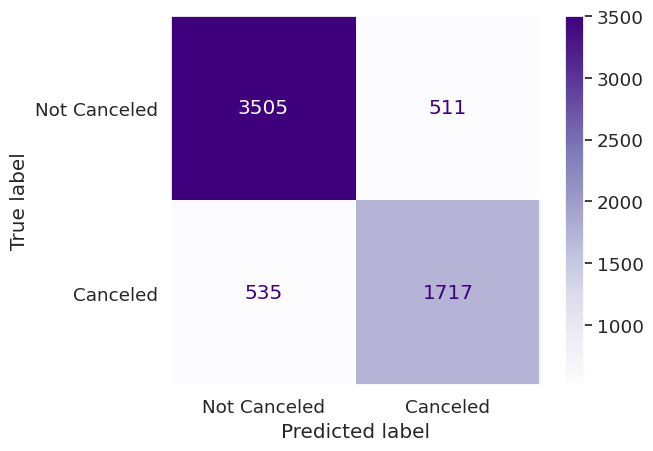

In [ ]:
dt = DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15,max_features= None, min_samples_split=2)

dt.fit(X1_train_r, Y1_train)
Y_pred=dt.predict(X1_test_r)
conf_mat = confusion_matrix(Y1_test, Y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])

disp.plot(cmap='Purples')

print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
evaluation_classifier(conf_mat)
plt.grid(None)


In [ ]:
acc_dt_pca = accuracy_score(Y1_test, Y_pred)

Random forest sa smanjenjem dimenzionalnosti

In [ ]:
X1 = df.iloc[:,0:17].copy()
Y1 = df.iloc[:,17].copy()

In [ ]:
X2=X1
Y2=Y1
Y2.loc[Y1==Y1.unique()[0]]=0
Y2.loc[Y1==Y1.unique()[1]]=1
Y2.head()

0    0
1    0
3    1
4    1
5    1
Name: booking_status, dtype: int64

In [ ]:
X2_train, X2_test, Y2_train, Y2_test = train_test_split(X2, Y2, test_size=0.2, stratify=Y2, random_state=46)

In [ ]:
s = StandardScaler()
s.fit(X1_train)
X2_train_std = s.transform(X2_train)
X2_test_std = s.transform(X2_test)

pca = PCA(n_components='mle')  
pca.fit(X2_train_std)
X2_train_r = pca.fit_transform(X2_train_std)  
X2_test_r = pca.transform(X2_test_std)

print('Dimenzije redukovanog prostora: ', pca.n_components_)

Dimenzije redukovanog prostora:  16


X2_train_r 
X2_test_r

In [ ]:
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

parameters = {'criterion':('gini', 'entropy'), 'max_depth':[5, 10, 15], 
              'min_samples_split':[0.01,0.05,2], 'class_weight':(None, 'balanced'), 'n_estimators':[100,200,300]}

rf = RandomForestClassifier()
clf=GridSearchCV(estimator=rf,param_grid=parameters,scoring='accuracy',cv=kfold,refit=True,verbose=3)
clf.fit(X2_train_r, Y2_train)
print(clf.best_score_)
print(clf.best_params_)

[[3699  317]
 [ 482 1770]]
procenat pogođenih uzoraka je:  87.25271218889597 %
Tacnost:  0.8725271218889598
Preciznost:  0.9210657370517928
Osetljivost:  0.8847165749820617
specificnost:  0.8481073310972688
F mera:  0.9025253141393192


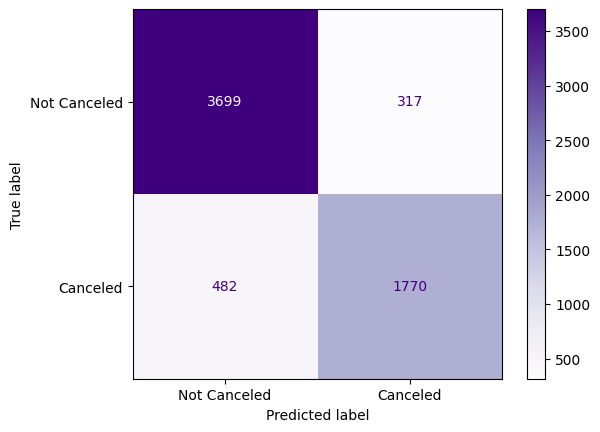

In [ ]:
dt = RandomForestClassifier(class_weight=None, criterion='gini', max_depth=15, min_samples_split=2, n_estimators=200)
dt.fit(X2_train_r, Y1_train)
Y_pred=dt.predict(X2_test_r)
conf_mat = confusion_matrix(Y2_test, Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,  display_labels=['Not Canceled','Canceled'])
disp.plot(cmap='Purples')
print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
evaluation_classifier(conf_mat)


In [ ]:
acc_rf_pca = accuracy_score(Y2_test, Y_pred)

# Uporedjivanje rezultata modela. 🥇 🥈 🥉

In [ ]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'Logistic Regression PCA', 'KNN Classification', 'KNN Classification PCA','Decision Trees',
             'Decision Trees PCA',
             'Random Forest','Random forest PCA'],
    'Score' : [acc_lr, acc_lr_pca, acc_knn, acc_knn_pca, acc_dt, acc_dt_pca, 
               acc_rf, acc_rf_pca]
})


models.sort_values(by = 'Score', ascending = True)


,Model,Score
0,Logistic Regression,0.81
1,Logistic Regression PCA,0.81
2,KNN Classification,0.81
5,Decision Trees PCA,0.83
3,KNN Classification PCA,0.84
7,Random forest PCA,0.87
4,Decision Trees,0.87
6,Random Forest,0.89


In [ ]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark', title = 'Poredjenje modela')